# CS5670 Project 5 Notebook - Convolutional Neural Networks

Welcome to Project 5 Notebook! In this project, you will learn:

1. Basic use of the PyTorch deep learning library
2. How to build and understand neural network models in PyTorch
3. How to backpropagate through the network w.r.t the image
4. How to generate adversarial examples

If this is your first time working with PyTorch, **please go through the "What is PyTorch" and "Neural Networks" tutorials in [Deep Learning with PyTorch: A 60 Minute Blitz](http://pytorch.org/tutorials/beginner/deep_learning_60min_blitz.html)**. It won't take too long, but you will learn a lot and make this assignment much easier! You can use a new Colab notebook for the tutorials.

# Intro

## Installation of Dependencies

Run the below cell to install PyTorch for this notebook

In [0]:
# http://pytorch.org/
from os import path
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())

accelerator = 'cu80' if path.exists('/opt/bin/nvidia-smi') else 'cpu'

!pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.3.0.post4-{platform}-linux_x86_64.whl torchvision
import torch

## Useful Functions

Run the below cell to initialize the provided functions that will be used in this assignment

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.autograd import Variable

import urllib
import cv2
import numpy as np
import os, sys,  math, random, subprocess
import matplotlib.pyplot as plt
from scipy.ndimage.filters import gaussian_filter
from IPython.display import clear_output, Image, display, HTML
from google.protobuf import text_format
from io import StringIO
import PIL.Image

# Configure matplotlib to render inline
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)        # large images
plt.rcParams['image.interpolation'] = 'nearest'  # don't interpolate: show square pixels
plt.rcParams['image.cmap'] = 'gray'  # use grayscale output rather than a (potentially misleading) color heatmap

    
def get_n_params(module):
  nparam = 0
  for name, param in module.named_parameters():
    param_count = 1
    for size in list(param.size()):
      param_count *= size
    nparam += param_count
  return nparam

def get_model_params(model):
  nparam = 0
  for name, module in model.named_modules():
    nparam += get_n_params(module)
  return nparam

def np_img_from_url(url):
  url_response = urllib.urlopen(url)
  img_array = np.array(bytearray(url_response.read()), dtype=np.uint8)
  img = cv2.imdecode(img_array, -1)
  return img

def to_numpy_image(tensor_or_variable):
  
  # If this is already a numpy image, just return it
  if type(tensor_or_variable) == np.ndarray:
    return tensor_or_variable
  
  # Make sure this is a tensor and not a variable
  if type(tensor_or_variable) == Variable:
    tensor = tensor_or_variable.data
  else:
    tensor = tensor_or_variable
  
  # Convert to numpy and move to CPU if necessary
  np_img = tensor.cpu().numpy()
  
  # If there is no batch dimension, add one
  if len(np_img.shape) == 3:
    np_img = np_img[np.newaxis, ...]
  
  # Convert from BxCxHxW (PyTorch convention) to BxHxWxC (OpenCV/numpy convention)
  np_img = np_img.transpose(0, 2, 3, 1)
  
  return np_img


def to_pytorch_image(np_image):
  
  # Create a batch dimension
  if len(np_image.shape) == 3:
    np_image = np_image[np.newaxis, ...]
  
  # Convert from BxHxWxC (OpenCV/numpy) to BxCxHxW (PyTorch)
  np_image = np_image.transpose(0, 3, 1, 2)
  
  pytorch_img = torch.from_numpy(np_image).float()
  
  return pytorch_img
  
def draw_border(image_np, color):
  color = np.asarray(color)
  s = image_np.shape
  image_np = image_np.copy()
  image_np[0:5, :, :] = color[np.newaxis, np.newaxis, :]
  image_np[:, 0:5, :] = color[np.newaxis, np.newaxis, :]
  image_np[s[0]-5:s[0], :, :] = color[np.newaxis, np.newaxis, :]
  image_np[:, s[0]-5:s[0], :] = color[np.newaxis, np.newaxis, :]
  return image_np

def normalize_zero_one_range(tensor_like):
  x = tensor_like - tensor_like.min()
  x = x / (x.max() + 1e-9)
  return x


def prep_for_showing(image):
  np_img = to_numpy_image(image)
  if len(np_img.shape) > 3:
    np_img = np_img[0]
  np_img = normalize_zero_one_range(np_img)
  return np_img

  
def show_image(tensor_var_or_np, title=None, bordercolor=None):
  np_img = prep_for_showing(tensor_var_or_np)
  
  if bordercolor is not None:
    np_img = draw_border(np_img, bordercolor)
  
  # plot it
  np_img = np_img.squeeze()
  plt.figure(figsize=(4,4))
  plt.imshow(np_img)
  plt.axis('off')
  if title: plt.title(title)
  plt.show()
    
def show_images(images, correct_list=None, size=128, titles=None):
  for i, image in enumerate(images):
    bordercolor = ([0,1,0] if correct_list[i] else [1,0,0]) if correct_list else None
    show_image(image, bordercolor=bordercolor, title=titles[i] if titles else None)
    
def show_image_rows(image_lists):
  for l in image_lists:
    #plt.figure(figsize=(1, len(l)))
    #plt.axis('off')
    f, axarr = plt.subplots(1,len(l))
    #print(axarr)
    for i,img in enumerate(l):
      img_np = prep_for_showing(img).squeeze()
      axarr[i].imshow(img_np)
      axarr[i].axis('off')
    plt.show()

from bs4 import BeautifulSoup
import requests

def listFD(url, ext=''):
  page = requests.get(url).text
  soup = BeautifulSoup(page, 'html.parser')
  return [url + '/' + node.get('href') for node in soup.find_all('a') if node.get('href').endswith(ext)]

def url_to_image(url):
	# download the image, convert it to a NumPy array, and then read
	# it into OpenCV format
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")
  image = cv2.imdecode(image, cv2.IMREAD_COLOR)
  
  # Convert BGR to RGB
  image = image[:, :, [2,1,0]]
  
  return image

def url_to_text(url):
  resp = urllib.request.urlopen(url)
  text = resp.read()
  return text.decode("utf-8")

## Dataset

The following cell implements a Dataset that loads the images that will be used later in this assignment.

It's a subclass of `torch.utils.data.Dataset`, which is a base class for Datasets in pytorch, and it is compatible with `torch.utils.data.Dataloader`. Dataloder is useful, because it allows us to easily load data in multiple background threads without writing any threading code. This is important, because one of the biggest bottlenecks in neural network training is the rate at which data can be fed into the model.

A dataset implements `__len__` and `__getitem__`, which means samples from the dataset can be obtained by indexing it like `sample = dataset[5]`.

A dataloader can be iterated and returns batches: `batch_0 = iter(dataloader).first()`

`torchvision` is useful suite of utilities when doing computer vision work with PyTorch. It already [provides implementations for many of the most popular computer vision datasets](http://pytorch.org/docs/master/torchvision/datasets.html). In this notebook, we have rolled our own dataset that loads images from a URL.

In [7]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

DATA_URL = "http://www.cs.cornell.edu/courses/cs5670/2018sp/projects/pa5/assignment_data/dataset/"
IMAGENET_LABELS_URL = "http://www.cs.cornell.edu/courses/cs5670/2018sp/projects/pa5/assignment_data/imagenet_classes.txt"
DOGS_DIR = "test-dog"
FOOD_DIR = "test-food"

IMAGENET_MEAN = torch.FloatTensor([0.485, 0.456, 0.406])
IMAGENET_STD = torch.FloatTensor([0.229, 0.224, 0.225])

class FoodAndDogDataset(Dataset):
  """
  PyTorch DataLoader compatible dataset that pre-loads images from the dataset
  directory on the CS5670 class website. Images are returned as tensors, normalized
  with the imagenet normalization.
  """
  def __init__(self, include_classes="both"):
    self.dog_paths = listFD(DATA_URL + DOGS_DIR, ".jpg")
    self.food_paths = listFD(DATA_URL + FOOD_DIR, ".jpg")
    
    self.dog_labels = [0 for _ in self.dog_paths]
    self.food_labels = [1 for _ in self.food_paths]
    
    self.img_paths = []
    self.img_labels = []
    
    if include_classes in ["both", "dogs"]:
      self.img_paths += self.dog_paths
      self.img_labels += self.dog_labels
    
    if include_classes in ["both", "food"]:
      self.img_paths += self.food_paths
      self.img_labels += self.food_labels
  
    # We might not want to do this on a real dataset, if we have a lot of data.
    # In that case we would lazy-download images.
    # But for now we will pre-download them, because there's not that many
    self.all_images_np = [url_to_image(url).astype(np.float32) / 255 for url in self.img_paths]
  
    print(f"Initialized dataset: {include_classes} with {len(self.all_images_np)} images")
  
  def __len__(self):
    return len(self.img_paths)
  
  def __getitem__(self, idx):
    img_i_np = self.all_images_np[idx]
    label_i = self.img_labels[idx]

    # Convert to pytorch. Copy so that we don't keep re-normalizing the same image multiple times.
    img_i_tensor = to_pytorch_image(img_i_np.copy())

    # Pre-process the image:
    # Normalize using the mean and variance of the ImageNet dataset
    # The model was trained from this dataset
    img_i_tensor = img_i_tensor - IMAGENET_MEAN[np.newaxis, :, np.newaxis, np.newaxis].expand_as(img_i_tensor)
    img_i_tensor = img_i_tensor / IMAGENET_STD[np.newaxis, :, np.newaxis, np.newaxis].expand_as(img_i_tensor)

    assert img_i_tensor.size(2) == img_i_tensor.size(3) == 256, "Images expected to be of shape 1x3x256x256"
    
    # Take a center-crop of image, assuming the image is 256x256
    img_i_tensor = img_i_tensor[:, :, 16:240, 16:240]

    return img_i_tensor[0], label_i
    
dog_dataset = FoodAndDogDataset(include_classes="dogs")
food_dataset = FoodAndDogDataset(include_classes="food")
full_dataset = FoodAndDogDataset(include_classes="both")

Initialized dataset: dogs with 33 images
Initialized dataset: food with 25 images
Initialized dataset: both with 58 images


## ILSVRC2012 class labels

In this project, we will be using an AlexNet image-classifier model pre-trained on the ILSVRC2012 dataset. In order to understand the model's output, we need a maping from the output probabilities to the class names. We load this mapping in this cell.

In [8]:
imagenet_id_to_label = {}
labels_file = url_to_text(IMAGENET_LABELS_URL)
labels_id2word = labels_file.split("\n")[:1000]
print(labels_id2word)

['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 'tiger shark, Galeocerdo cuvieri', 'hammerhead, hammerhead shark', 'electric ray, crampfish, numbfish, torpedo', 'stingray', 'cock', 'hen', 'ostrich, Struthio camelus', 'brambling, Fringilla montifringilla', 'goldfinch, Carduelis carduelis', 'house finch, linnet, Carpodacus mexicanus', 'junco, snowbird', 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 'robin, American robin, Turdus migratorius', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel, dipper', 'kite', 'bald eagle, American eagle, Haliaeetus leucocephalus', 'vulture', 'great grey owl, great gray owl, Strix nebulosa', 'European fire salamander, Salamandra salamandra', 'common newt, Triturus vulgaris', 'eft', 'spotted salamander, Ambystoma maculatum', 'axolotl, mud puppy, Ambystoma mexicanum', 'bullfrog, Rana catesbeiana', 'tree frog, tree-frog', 'tailed frog, bell toad, 

## Notes on PyTorch

PyTorch implements many operations on Tensors (such as torch.FloatTensor or torch.LongTensor) in much the same way numpy implements operations on ndarray. Variables (torch.autograd.Variable) wrap tensors and can be used interchangeably. When an operation is performed on a Tensor, the output is a new Tensor. When it is performed on a Variable, the output is also a Variable.

All operations involving Variables automatically build a computational graph (provided the requires_grad parameter is set to True on any of the Variable's involved in the operation). This means that at any point, calling `backward` on any Variable will compute the gradient of that Variable with respect to all other Variables. Thus calling `backward` on the loss function we're trying to optimize will calculate the gradient w.r.t model parameters, allowing us to implement gradient descent.

We can also use `.backward` to calculate a gradient w.r.t the input, provided the `requires_grad` attribute on the input variable is set to true. After calling `backward`, the gradients can be accessed in the `.grad` attribute of the variable. Here is some fairly typical code that uses this functionality to access gradients with respect to an input variable:


Given input and target of type torch.FloatTensor. First we must zero gradients on any variable that already has gradients coputed. On nn.Module, this zeroes gradients of all the model parameters.
  
```
  some_model.zero_grad()
```
  
Convert the input into a variable that requires gradient
```
  input_var = Variable(input, requires_grad=True)
  target_var = Variable(target)
```
  
Call the model and calculate the loss
```
  out = some_model(input_var)
  loss = some_loss_function(out, target)
```

Run backpropagation
```
  loss.backward()
```

Access gradients of the loss with respect to the input
```
  grad_input = input_var.grad
  
  grad_input_tensor = grad_input.data
  
  grad_input_numpy = grad_input_tensor.cpu().numpy()
  
```

The underlying Tensor can be accessed as the `data` attribute given a Variable.

PyTorch implements many neural network operations in the `torch.nn` package. These are usually packaged in a `Module`, which allows for easy modular design of neural network architectures.

## AlexNet definition

Below is the `Module` that implements AlexNet, copied from the `torchvision` package, with minor modifications for easier use in this assignment. Specifically, because the original implementation uses nn.Sequential containers, the individual layers are not directly accessible. We have made them directly accessible by defining the `shortcut_modules` attribute.

In [10]:
import torch.nn as nn
import torch.utils.model_zoo as model_zoo


model_urls = {
    'alexnet': 'https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth',
}

INPLACE = False

class AlexNet(nn.Module):

    def __init__(self, num_classes=1000):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=INPLACE),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=INPLACE),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=INPLACE),
            nn.Linear(4096, num_classes),
        )
        
        self.module_shortcuts = {
            "conv1": self.features[0],
            "relu1": self.features[1],
            "conv2": self.features[3],
            "relu2": self.features[4],
            "conv3": self.features[6],
            "relu3": self.features[7],
            "conv4": self.features[8],
            "relu4": self.features[9],
            "conv5": self.features[10],
            "relu5": self.features[11],
            
            "fc6": self.classifier[2],
            "fc7": self.classifier[5],
            "fc8": self.classifier[6]
        }
    
        
    def __getitem__(self, layer_name):
      if layer_name in self.module_shortcuts:
        return self.module_shortcuts[layer_name]
      return None
    
    
    def shortcut_modules(self):
      for name, mod in self.module_shortcuts.items():
        yield name, mod
    
    
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), 256 * 6 * 6)
        x = self.classifier(x)
        return x


def alexnet(pretrained=False, **kwargs):
    r"""AlexNet model architecture from the
    `"One weird trick..." <https://arxiv.org/abs/1404.5997>`_ paper.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = AlexNet(**kwargs)
    if pretrained:
        print("Loading pre-trained weights from model zoo")
        model.load_state_dict(model_zoo.load_url(model_urls['alexnet']))
    model.eval()
    return model

model = alexnet(pretrained=True, num_classes=1000)

Loading pre-trained weights from model zoo


# Student TODO Implementations

Implement all of your solutions in this secion

**Answer TODO 1 here**:

1. There are 5 layers of CNN and 3 fully connected layers. And max pooling is performed in between each of the CNN layers. fc8 is simply the output layer where the dimention of the output corresponds to number of classes. On contraray, fc6 and fc7 are transformed by ReLU and dropout. ReLU would guarantee that the output is non-linear and non-negrative. Dropout would prevent model to overfit. ReLU is not perforemed on fc8, so fc8 spans over both positive and negative output values.

In [0]:
def convert_ilsvrc2012_probs_to_dog_vs_food_probs(probs_ilsvrc):
    """
    Convert from 1000-class ILSVRC probabilities to 2-class "dog vs food"
    incices.  Use the variables "dog_indices" and "food_indices" to map from
    ILSVRC2012 classes to our classes.
    HINT:
    Compute "probs" by first estimating the probability of classes 0 and 1,
    using probs_ilsvrc.  Stack together the two probabilities along axis 1, and
    then normalize (along axis 1).
    :param probs_ilsvrc: shape (N, 1000) probabilities across 1000 ILSVRC classes
    :return probs: shape (N, 2): probabilities of each of the N items as being
        either dog (class 0) or food (class 1).
    """
    # in the ILSVRC2012 dataset, indices 151-268 are dogs and index 924-969 are foods
    dog_indices = range(151, 269)
    food_indices = range(924, 970)
    N, _ = probs_ilsvrc.shape
    probs = np.zeros((N, 2)) # placeholder
    ############################ TODO 2 BEGIN #################################
    dogSum = 0
    foodSum = 0

    for i in range(N):
        dog = sum(probs_ilsvrc[i, dog_indices])
        food = sum(probs_ilsvrc[i, food_indices])
        probs[i] = (dog, food)
        probs[i] = probs[i]/sum(probs[i])
    ############################ TODO 2 END #################################
    return probs

In [0]:
def get_prediction_descending_order_indices(probs, cidx):
    """
    Returns the ordering of probs that would sort it in descending order
    :param probs: (N, 2) probabilities (computed in TODO 2)
    :param cidx: class index (0 or 1)
    :return list of N indices that sorts the array in descending order
    """
    order = range(probs.shape[0]) # placeholder
    ############################ TODO 3 BEGIN #################################
    order = np.argsort(probs[:,cidx])[::-1]
    ############################ TODO 3 END #################################
    return order

In [0]:
def compute_dscore_dimage(scores, image, class_idx):
    """
    :param scores: (Variable) shape (1000) the output scores from AlexNet for image
    :param image: (Variable) shape (1, 3, 224, 244) the input image
    :param class_idx: class index in range [0, 999] indicating which class to compute saliency for
    :return grad: (3, 224, 224) array, gradient ds_y / dI  
    
    """
    grad = torch.zeros_like(image) # placeholder
    ############################ TODO 4 BEGIN #################################
    loss = scores[class_idx]
    loss.backward()
    grad = image.grad
    ############################ TODO 4 END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad[0]

In [0]:
def normalized_sgd_with_momentum_update(image, grad, velocity, momentum, learning_rate):
    """
    THIS IS SLIGHTLY DIFFERENT FROM NORMAL SGD+MOMENTUM; READ THE NOTEBOOK :)
    Update the image using normalized SGD+Momentum.  To make learning more
    stable, normalize the gradient before using it in the update rule.
    :param image: (Variable) shape (1, 3, 224, 244) the current solution
    :param grad: (Variable) gradient of the loss with respect to the image
    :param velocity: (Variable) momentum vector "V"
    :param momentum: (float) momentum parameter "mu"
    :param learning_rate: (float) learning rate "alpha"
    :return: the updated image and momentum vector (image, velocity)
    """
    ############################ TODO 5a BEGIN #################################
    velocity = momentum*velocity - learning_rate * grad/grad.norm()
    image = image + velocity    
    ############################ TODO 5a BEGIN #################################
    return image, velocity

In [0]:
def fooling_image_gradient(target_score, orig_data, image_in, target_class, reg_lambda):
    """
    Compute the gradient for make_fooling_image (dL / dI).
    :param target_score: (Variable) holding the current score assigned to the target class
    :param orig_data: (Variable) shape (1, 3, 224, 224) holding the original image
    :param image_in: (Variable) shape (1, 3, 224, 224) hoding the current solution
    :param target_class: (int) ILSVRC class in range [0, 999]
    :param reg_lambda: (float) weight applied to the regularizer.
    """
    grad = torch.zeros_like(image) # placeholder
    ############################ TODO 5b BEGIN #################################
    reg = 0.5*reg_lambda*(((image_in-orig_data)).norm()**2)
    loss = -target_score + reg
    loss.backward()
    grad = image_in.grad  
    ############################ TODO 5b END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad

In [0]:
def class_visualization_gradient(target_score, image, target_class, reg_lambda):
    """
    Compute the gradient for make_class_visualization (dL / dI).
    :param target_score: (Variable) holding the current score assigned to the target class
    :param image: (Variable) shape (1, 3, 224, 224) the current solution
    :param target_class: (int) ILSVRC class in range [0, 999]
    :param regularization: (float) weight (lambda) applied to the regularizer.
    """
    grad = torch.zeros_like(image) # placeholder

    ############################ TODO 6 BEGIN #################################
    reg = 0.5*reg_lambda*((image.norm())**2)
    loss = reg - target_score
    loss.backward()
    grad = image.grad 
    ############################ TODO 6 END #################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    return grad

In [0]:
#@title Default title text
def feature_inversion_gradient(data, target_feat, current_feat, reg_lambda):
    """
    Compute the gradient for make_feature_inversion (dL / dI).
    :param data: (Variable) shape (1, 3, 224, 224) the current solution
    :param target_feat: (Variable of any shape) target features at layer l
    :param current_features: (Variable of same shape)current features at layer l
    :param reg_lambda: weight (lambda) applied to the regularizer.
    """
    grad = torch.zeros_like(data) # placeholder
    ############################ TODO 7a BEGIN (EXTRA CREDITS) #################################
    loss_reg = 0.5*reg_lambda*((data.norm())**2)
    loss_target = (0.5/len(current_feat))*(((current_feat-target_feat)).norm()**2)
    loss = loss_target + loss_reg
    loss.backward()
    grad = data.grad
    ############################ TODO 7a END (EXTRA CREDITS)#################################
    assert tuple(grad.shape) == (1, 3, 224, 224) # expected shape
    
    return grad, loss.data[0], loss_target.data[0], loss_reg.data[0]

**Answer TODO 7b here (EXTRA CREDITS)**:
> (a) (EXTRA CREDITS) The picture becomes blurrier as the Neural Network is describing the image at a higher level. The first few layers are grabbing features pixel by pixel. As the layers go deeper, the features become more abstract and indistiguishable, thus more representative. It uses feature learned to depict and reconstruct a picture prediction. Therefore, it looks more and more blury, meaning the feature learned are not overfiting the training image.


> (b) (EXTRA CREDITS) The regualization paramenter is preventing the weights to get too large thus overfitting the picture, and model has poor prediction performance. Also, it prevents radical changes in between each layer, so the learning curve can be more smooth. The regularization parameter could be directly placed into the objective function to avoid placing it in every layer.



# 1. AlexNet: Visualizing Structure

The AlexNet model consists of 5 convolutional layers and three fully connected layers.
Each of these layers is encapsulated in an `nn.Module` class that has one or more trainable parameters.

We can look the shapes of each of the model parameters using the below cell:

In [20]:
model_num_params = 0

# Loop through all modules
model_num_params = get_n_params(model)
print(f"# params in AlexNet: {model_num_params}")

# Loop through the select modules that we've named:
for simple_name, module in model.shortcut_modules():
  if hasattr(module, "weight"):
    print(f"Module {simple_name} weights: {module.weight.size()} bias: {module.bias.size()}")

# params in AlexNet: 61100840
Module conv1 weights: torch.Size([64, 3, 11, 11]) bias: torch.Size([64])
Module conv2 weights: torch.Size([192, 64, 5, 5]) bias: torch.Size([192])
Module conv3 weights: torch.Size([384, 192, 3, 3]) bias: torch.Size([384])
Module conv4 weights: torch.Size([256, 384, 3, 3]) bias: torch.Size([256])
Module conv5 weights: torch.Size([256, 256, 3, 3]) bias: torch.Size([256])
Module fc8 weights: torch.Size([1000, 4096]) bias: torch.Size([1000])


### Visualizing conv1 filters

Filters in conv1 are unique in that they take RGB images as input. This means that we can visualize them as RGB images. For all other layers, we cannot view them as nice little colored squares because they are much higher dimensional.

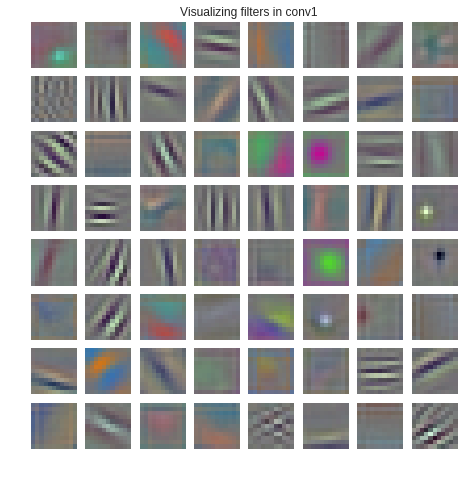

In [21]:
def vis_square(data, title=None):
    """Take a Tensor of shape (n, K, height, width) or (n, K, height, width)
       and visualize each (height, width) thing in a grid of size approx. sqrt(n) by sqrt(n)"""
    
    if data.size(1) > 3:
      data = data.view(-1, 1, data.size(2), data.size(3))
        
    data = to_numpy_image(data)
        
    # normalize data for display
    data = (data - data.min()) / (data.max() - data.min())
    
    # force the number of filters to be square
    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = (((0, n ** 2 - data.shape[0]),
               (0, 2), (0, 2))                 # add some space between filters
               + ((0, 0),) * (data.ndim - 3))  # don't pad the last dimension (if there is one)
    data = np.pad(data, padding, mode='constant', constant_values=1)  # pad with ones (white)
    
    # tile the filters into an image
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3) + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    
    data = data.squeeze()
    
    # plot it
    plt.figure(figsize=(8, 8))
    plt.imshow(data)
    plt.axis('off')
    if title: plt.title(title)
      

weights = model.features[0].weight.data
vis_square(weights, title="Visualizing filters in conv1")

## Visualizing AlexNet activations.

PyTorch uses dynamic computational graphs. As a result of this, there is no way for us to directly access the intermediate activations as there is no fixed placeholder for them. In PyTorch, we can access intermediate activations using hooks. A forward hook is a function that gets called every time that the forward method on a module has been executed. To access intermediate activations, we register a forward hook that displays the activations.

Let's take an example image and pass it through AlexNet.

Visualize the activations inside all of these layers, using the code below. Lighter values have higher magnitude, and darker values have smaller magnitude.

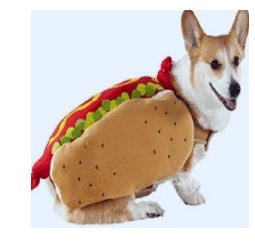

In [22]:
# Load the image of the dog
example_image, label = dog_dataset[10]
show_image(example_image)

Loading pre-trained weights from model zoo
Visualizing layer: conv1
Visualizing layer: relu1
Visualizing layer: conv2
Visualizing layer: relu2
Visualizing layer: conv3
Visualizing layer: relu3
Visualizing layer: conv4
Visualizing layer: relu4
Visualizing layer: conv5
Visualizing layer: relu5
Visualizing layer: fc6
Visualizing layer: fc7
Visualizing layer: fc8


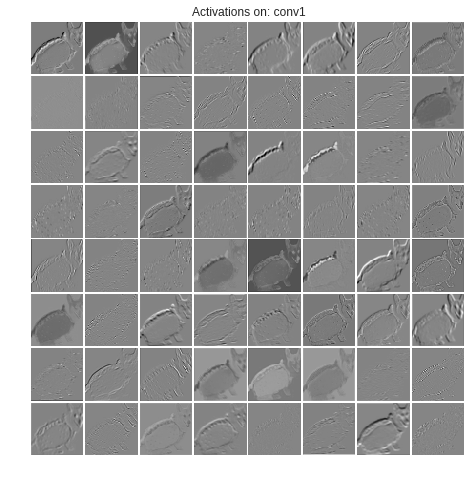

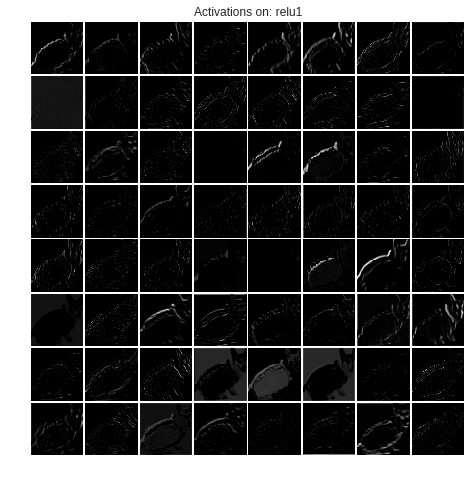

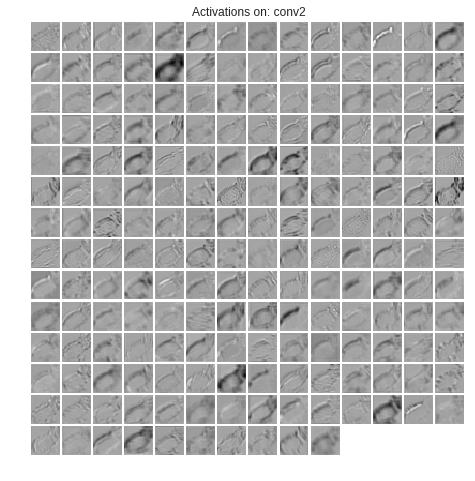

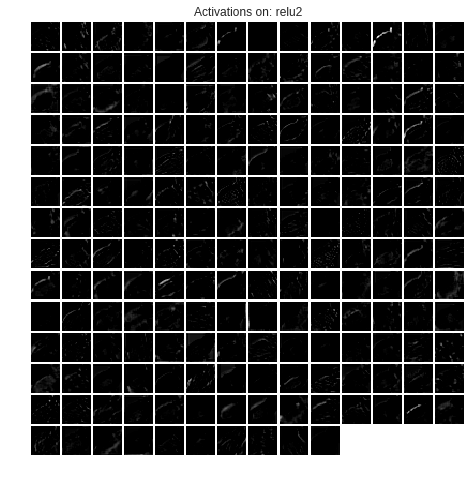

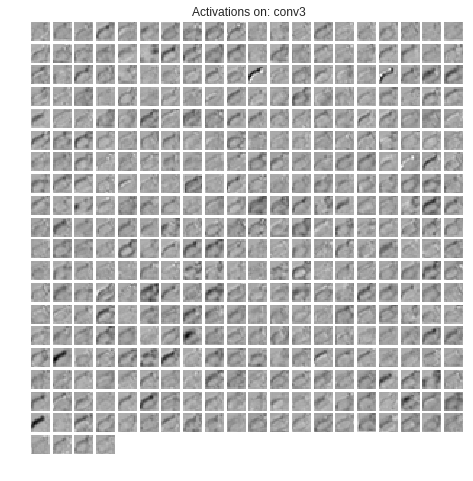

...

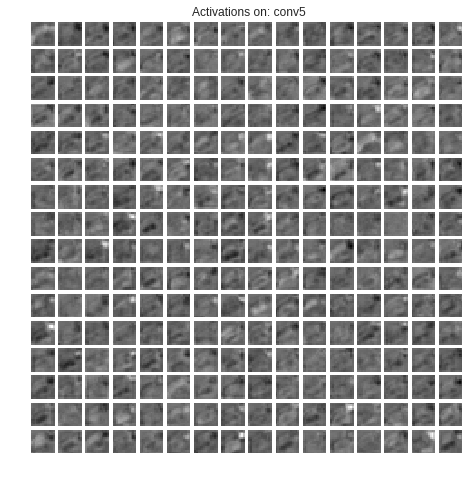

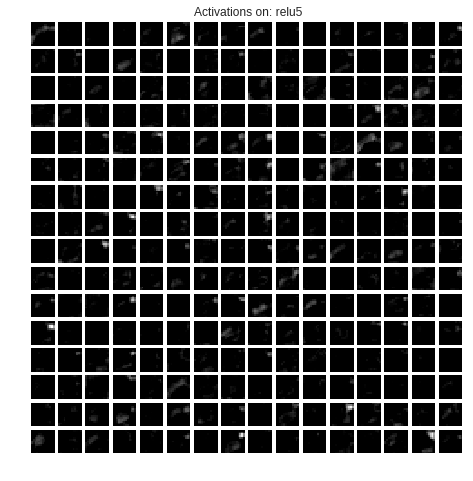

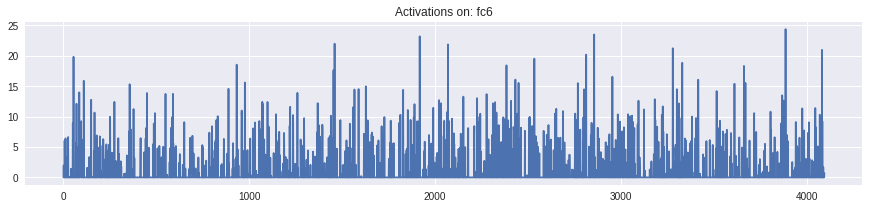

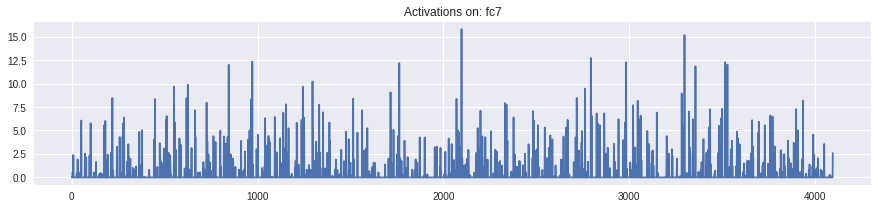

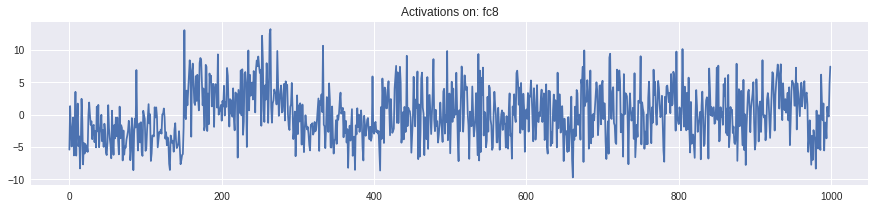

In [23]:
import functools

# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)

# Define a hook that visualizes a layer output
def show_activations_hook(name, module, input, output):
  
  print(f"Visualizing layer: {name}")
  # For conv/relu layer outputs (BxCxHxW) we plot an image as before
  if output.dim() == 4:
    vis_square(output, f"Activations on: {name}")
  
  # For linear layer outputs, we plot the activations as a line plot
  else:
    feat = output.data.view([-1]).cpu().numpy()
    plt.figure(figsize=(15, 3))
    plt.plot(feat)
    plt.title(f"Activations on: {name}")
  
# Register the hook on the select set of modules
for name, module in model.shortcut_modules():
  hook = functools.partial(show_activations_hook, name)
  module.register_forward_hook(hook)
  
# PyTorch modules work on minibatches and expect the first axis to be the batch axis
# If we run a model on a single image, we must turn this into a batch of size 1
model_input = Variable(example_image[np.newaxis, ...])

# Run the forward pass on the model
class_activations = model(model_input)[0]

### ?? Question ??

Consider the visualizations produced by the above cell. Why does `fc8` have negative values, but `fc6` and `fc7` are only positive?

HINT: Look at the structure of the network above, and our selection of named layers in `AlexNet.module_shortcuts`.

###**<font color='red' size='3em'>TODO 1: Write your answer in the "Student Implementations" cell as a comment</font>**

## Looking up the class names

The AlexNet model above outputs unconstrained class "scores". To turn these scores into a valid probability distribution over the 1000 ImageNet classes, we apply the softmax activation. We can find the index of the class with the maximum score and map that back to a description of the class in words.

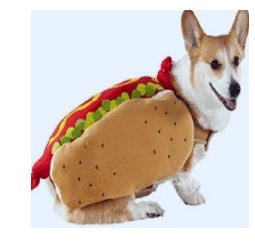

Loading pre-trained weights from model zoo
Predicted class: 264 - Cardigan, Cardigan Welsh corgi with probability 0.2995464503765106


In [24]:
# Load the image of the hot dog
example_image, label = dog_dataset[10]
show_image(example_image)

# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)

# Set to eval mode to disable dropout
model.eval()

model_input = example_image[np.newaxis, ...]

model_input = model_input.clone()

# Run the forward pass on the model
class_activations = model(Variable(model_input))[0]

# Compute class probabilities
class_probs = F.softmax(class_activations, dim=0)

# Get the class index
prob, class_idx = torch.max(class_probs, 0)

# Take the integer index out of the variable and tensor
class_idx = class_idx.data[0]

predicted_class_name = labels_id2word[class_idx]
print(f"Predicted class: {class_idx} - {predicted_class_name} with probability {prob.data[0]}")

** What to expect **

We can see that this example was correctly classified, and with high confidence, despite the dog wearing a misleading costume!

# 2. Dog vs Food: Classification

Let's classify dog vs food. We have prepared a test set of dogs dressed up like hotdogs, and hotdogs cut to look like animals.
The below cell visualizes all the images in our dataset:

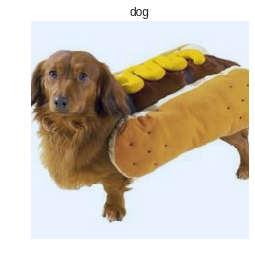

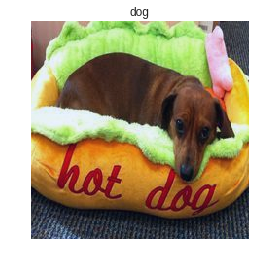

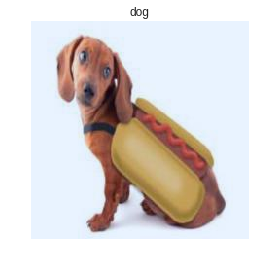

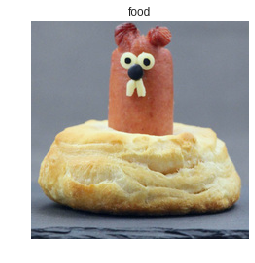

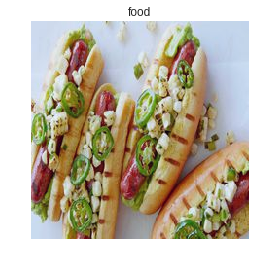

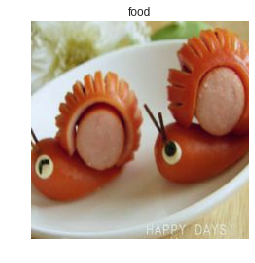

In [25]:
classes = ['dog', 'food']
class_datasets = [dog_dataset, food_dataset]

for cidx, cname in enumerate(classes):
  for i, (image, label) in enumerate(class_datasets[cidx]):
    if i >= 3:
      break
    show_image(image, classes[label])

### Repurposing the ILSVRC2012 Classifier

AlexNet was trained to recognize one of 1000 classes. We can repurpose it for our "food vs dog" task by remapping the categories.

###**<font color="red">TODO 2: Implement `convert_ilsvrc2012_probs_to_dog_vs_food_probs`</font>**

In [26]:
# Re-define the model to clear any previously registered hooks
model = alexnet(pretrained=True, num_classes=1000)
N = len(full_dataset)

dataloader = DataLoader(
    full_dataset,
    batch_size=1024,
    shuffle=False,
    num_workers=0,
    pin_memory=False,
    drop_last=False)

assert len(dataloader) == 1, "Since batch_size is bigger than the number of examples, we should only have one batch"

for batch in dataloader:
  images = batch[0]
  labels = batch[1]
  labels_np = labels.numpy()
  
  class_activations = model(Variable(images))
  ilsvrc_class_probs = F.softmax(class_activations, dim=1)
  
  # Convert from Variable containing FloatTensor to numpy ndarray
  ilsvrc_class_probs_np = ilsvrc_class_probs.data.cpu().numpy()

  dogfood_class_probs_np = convert_ilsvrc2012_probs_to_dog_vs_food_probs(ilsvrc_class_probs_np)

  assert list(dogfood_class_probs_np.shape) == [N, 2]
  
  np.testing.assert_almost_equal(np.sum(dogfood_class_probs_np, axis=1), np.ones(N), decimal=5)
  
  print("Seems correct!")

Loading pre-trained weights from model zoo
Seems correct!


### Measuring the accuracy

You should expect to get ~90% accuracy for dogs and ~96% accuracy for food with an overall accuracy of 93%.


In [27]:
predicted_class = np.argmax(dogfood_class_probs_np, axis=1)
correct_mask = predicted_class == labels_np
num_correct = np.sum(correct_mask)
accuracy = 100.0 * float(num_correct) / N

print(f"Overall accuracy {accuracy} {num_correct} / {N}")

for cidx, cname in enumerate(classes):
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  num_correct = np.sum(predicted_cls == cidx)
  cls_acc = 100.0 * float(num_correct) / cls_mask.sum()

  print(f"{cname} class accuracy {cls_acc} {num_correct} / {cls_mask.sum()}")

Overall accuracy 93.10344827586206 54 / 58
dog class accuracy 90.9090909090909 30 / 33
food class accuracy 96.0 24 / 25


# 3. Dog vs Food: Visualization

We can sort the predictions by the "dog" score and "food" score. The images are sorted according to how much AlexNet thinks the image belongs to that category.

Images are colored green/red depending on whether the prediction was correct.

For this assignment, you should expect that the incorrect predictions are all near the bottom (with the lowest score). This is a property that is very desirable -- mistakes only happen with lower scores. Note that in general real-world tasks, this does not always happen for free. If you want to be able to estimate the confidence of being correct, you need to separately predict that, and it is not easy to predict.

###**<font color="red"> TODO 3: Implement get_prediction_descending_order_indices </font>**

Predictions for class: dog


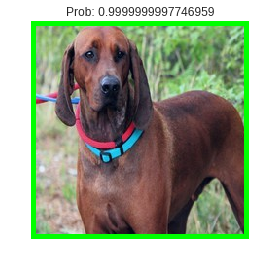

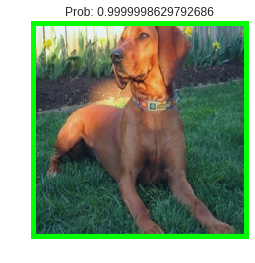

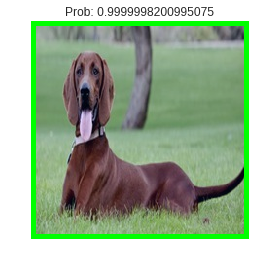

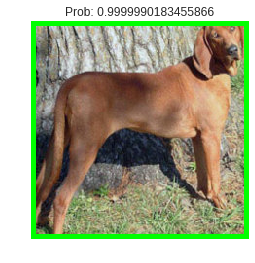

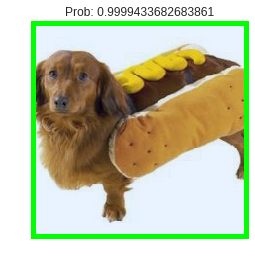

...

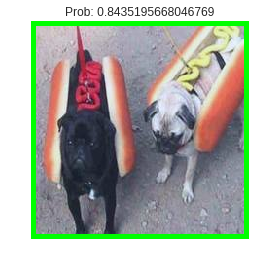

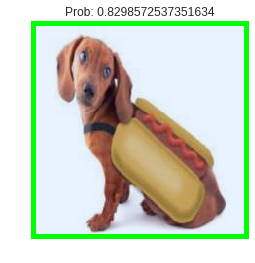

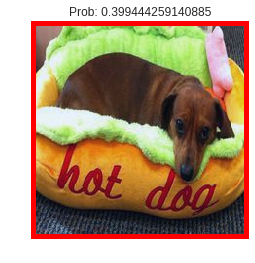

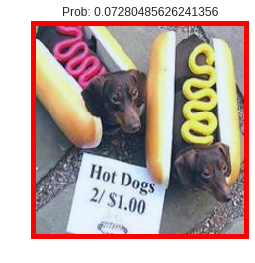

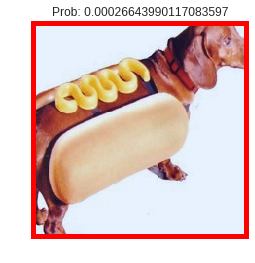

Predictions for class: food


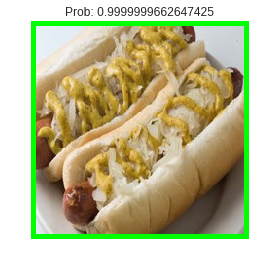

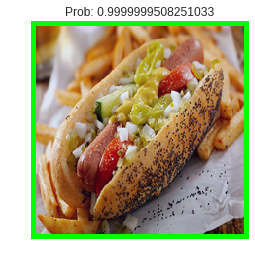

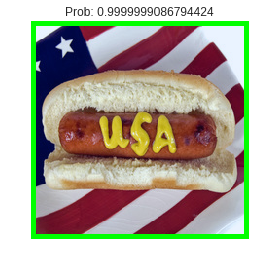

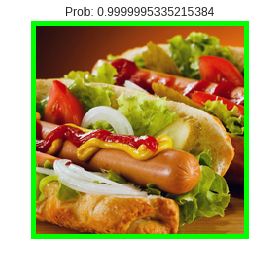

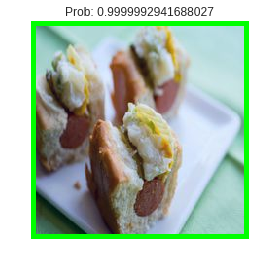

...

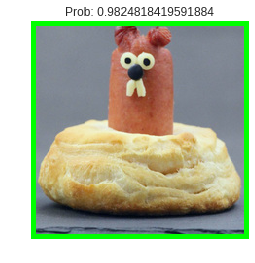

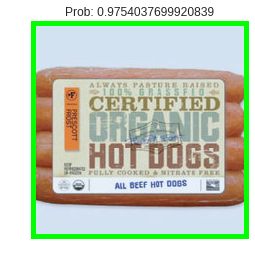

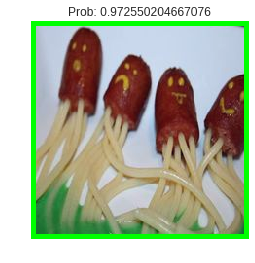

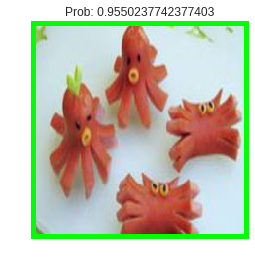

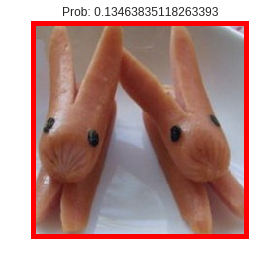

In [28]:
for cidx, cname in enumerate(classes):
  print(f"Predictions for class: {cname}")
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  cls_probs = dogfood_class_probs_np[cls_mask]
  correct = [p == cidx for p in predicted_cls]
  
  cls_images = [images[i] for i in range(len(images)) if cls_mask[i]]
  
  order = get_prediction_descending_order_indices(cls_probs, cidx)
  
  assert len(order) == cls_mask.sum()
  
  show_images(
    images = [cls_images[i] for i in order],
    correct_list = [correct[i] for i in order],
    titles = [f"Prob: {cls_probs[i, cidx]}" for i in order],
    size=128
  )

# 4. Visualizing saliency
Using our pre-trained AlexNet, we will compute class saliency maps as described in Section 3.1 of [2]. As mentioned in Section 2 of the paper, you should compute the gradient with respect to the image of the unnormalized class score (fc8), not of the normalized class probability (prob). You will need to use the backward method of the module to compute gradients with respect to the image.

We want to compute: $${\partial s_y \over \partial I}$$

where $s_y$ is the score for class $y$ after layer fc8, but before applying the Softmax layer.

We will then visualize the squared magnitude of this (max across color channels), to estimate the saliency of the class across the input image. See [1] for more details and intuition.



###**<font color="red">TODO 4: Implement compute_dscore_dimage</font>**

NOTE: You don't need to call model() in your function; this has already been run for you. Same for all gradient functions you implement below.

[[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps", ICLR Workshop 2014.](http://arxiv.org/pdf/1312.6034.pdf)

Loading pre-trained weights from model zoo
Saliency for class: dog


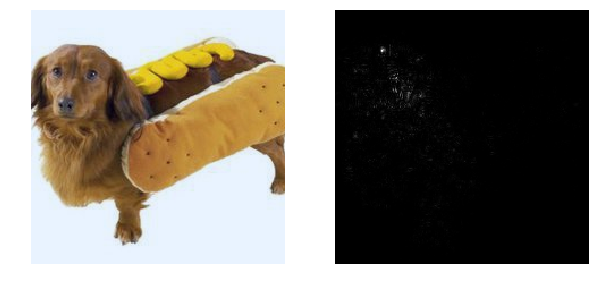

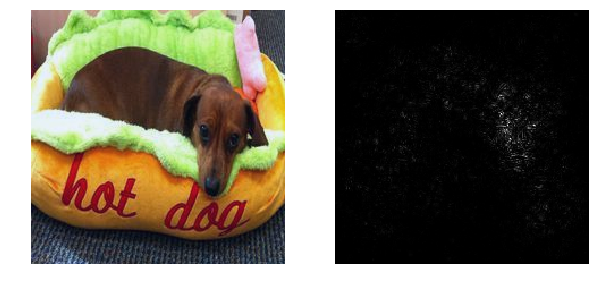

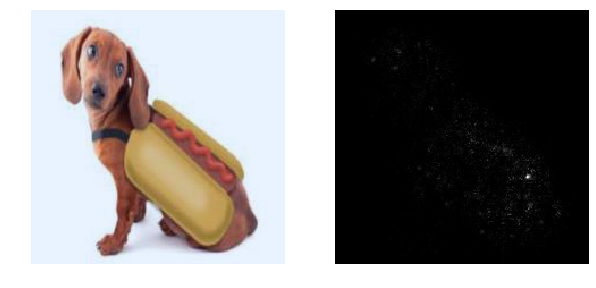

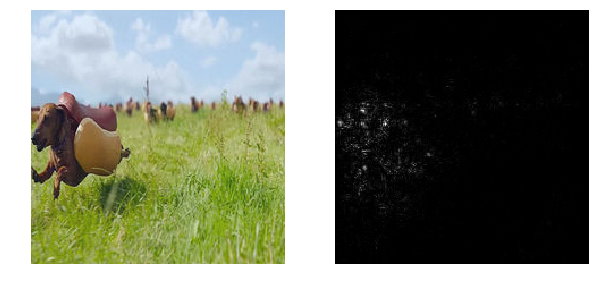

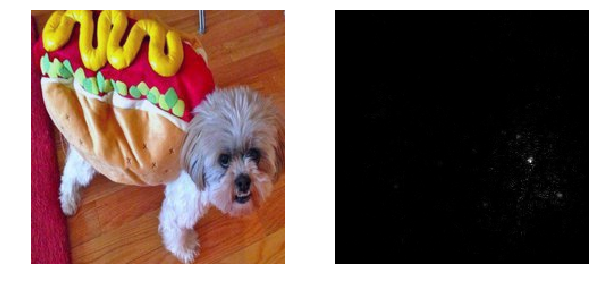

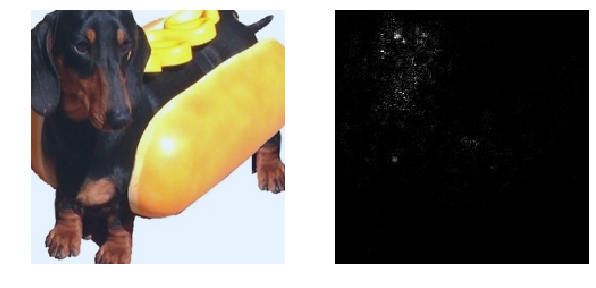

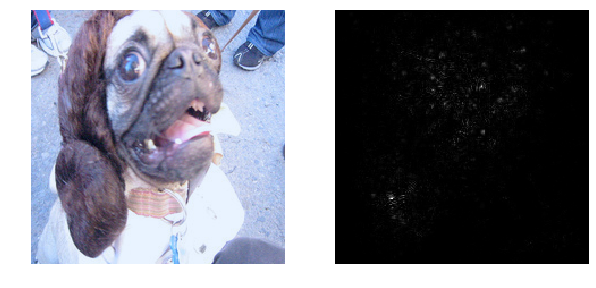

Saliency for class: food


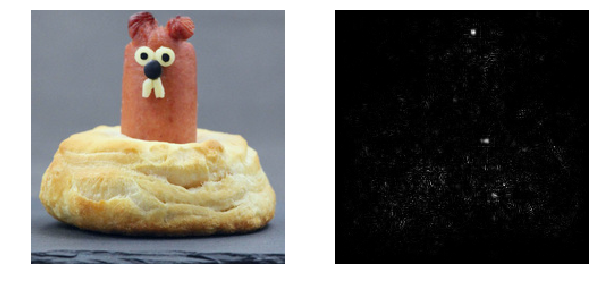

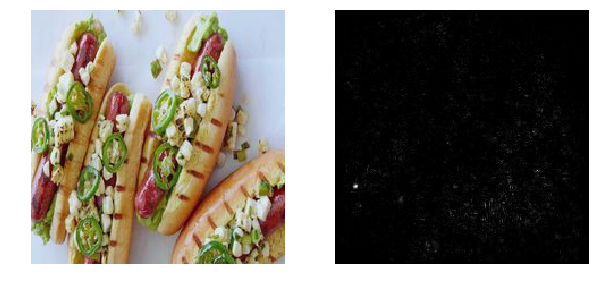

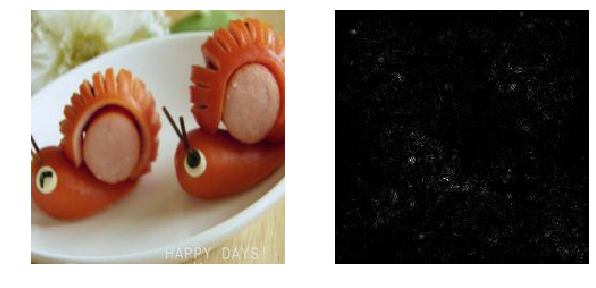

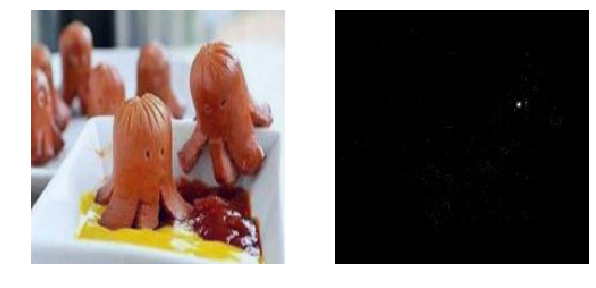

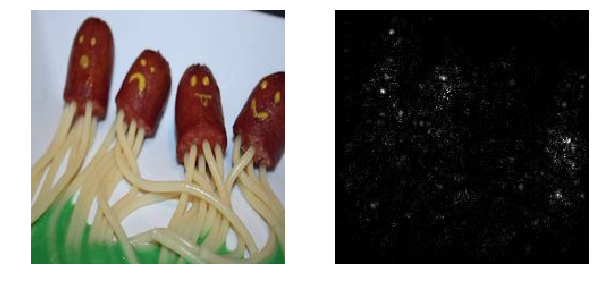

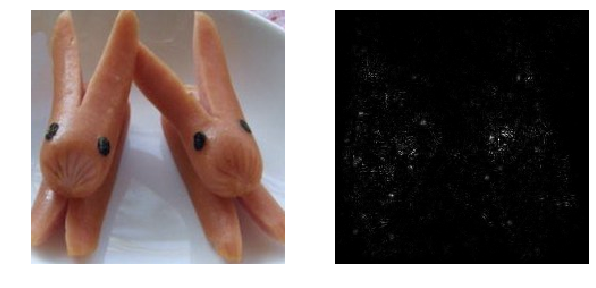

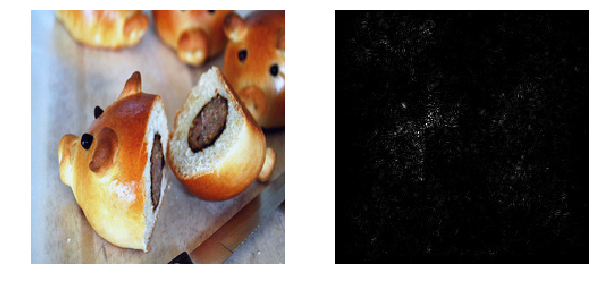

In [29]:
model = alexnet(pretrained=True)

def visualize_saliency(image):
    image_in = Variable(image.unsqueeze(0), requires_grad=True)
    cls_scores = model(image_in)[0]
    max_score, max_idx = torch.max(cls_scores, 0)
  
    grad = compute_dscore_dimage(cls_scores, image_in, max_idx)
    
    vis = grad * grad
    vis, _ = torch.max(vis, 0)
    
    return vis

class_datasets = [dog_dataset, food_dataset]
  
num_images = 6
for cidx, cname in enumerate(classes):
  
  print(f"Saliency for class: {cname}")
  in_images = []
  vis_images = []
  
  for i, sample in enumerate(class_datasets[cidx]):
    image_i = sample[0]
    label_i = sample[1]
  
    vis_image = visualize_saliency(image_i)
    
    assert list(vis_image.shape) == [224, 224]
    
    vis_images.append(vis_image.unsqueeze(0))
    in_images.append(image_i)
    if i >= num_images:
      break
  
  row_list = list(zip(in_images, vis_images))
  
  show_image_rows(row_list)
  
  cls_mask = labels_np == cidx
  predicted_cls = predicted_class[cls_mask]
  cls_probs = dogfood_class_probs_np[cls_mask]

# 5. Fooling AlexNet
For many machine learning models, it is possible to "fool" them by tweaking the image slightly so that the image is predicted to become any category [1]. Given any image, and any target class, you can perform gradient ascent to maximize the score of that target class (equivalently, gradient descent on the negative score of that class), stopping when the network confidently predicts it as the target class.

Again, maximize the score with respect to the unnormalized class score (fc8) and not the normalized class probability (prob).

In addition to maximizing the score (minimizing the negative score), also add a regularizer that computes the L2 norm between the original image, and the fooling image. The final gradient will be the sum of the gradient from the regularizer and the gradient from maximizing the class score.

We can write this as a loss $L$: $$
L = -s_y(I) + R(I)
$$

where $$
R(I) = 0.5 \lambda \|I - I_\text{orig}\|_2^2
$$$y$ is the target class, and $\lambda$ is the regularization.

**Momentum**

When optimizing functions with ConvNets, typically you use use gradient descent with momentum, which has the update rule: $$V_t = \mu V_{t-1} - \alpha G$$$$I_t = I_{t-1} + V_{t}$$

where $V$ is the velocity, $\alpha$ is the learning rate, $\mu$ is the momentum parameter, $t$ is the iteration number, and $G = \frac{\partial L}{\partial I_{t-1}}$ is the gradient.

To improve stability, we will use a slightly different update, which normalizes the gradient $G$ to have unit norm: $$V_t = \mu V_{t-1} - \alpha \frac{G}{\|G\|}$$$$I_t = I_{t-1} + V_{t}$$

[1] Szegedy et al, "Intriguing properties of neural networks", ICLR 2014

###**<font color="red">TODO 5a: Implement the above update rule, normalized_sgd_with_momentum_update</font>**

###**<font color="red">TODO 5b: Implement fooling_image_gradient which returns the gradient of the loss with respect to the image $({\partial L \over \partial I})$.**

Loading pre-trained weights from model zoo
Fooling AlexNet into thinking this is a: snail
(1/100), 9.150047617367818e-05 confidence
(2/100), 0.00013498923863153323 confidence
(3/100), 0.0002656662445588154 confidence
(4/100), 0.0007068187642289558 confidence
(5/100), 0.0024299544747918844 confidence
(6/100), 0.010555092012509704 confidence
(7/100), 0.0572475662920624 confidence
(8/100), 0.3798806108534336 confidence
(9/100), 2.1690886467695236 confidence
(10/100), 9.412197023630142 confidence
(11/100), 29.402464628219604 confidence
(12/100), 59.4379186630249 confidence
(13/100), 83.27611088752747 confidence
(14/100), 94.50084567070007 confidence
Fooling AlexNet into thinking this is a: snail
(1/100), 0.0012756262549373787 confidence
(2/100), 0.0015387779058073647 confidence
(3/100), 0.002145459257008042 confidence
(4/100), 0.0032759959140093997 confidence
(5/100), 0.0054602267482550815 confidence
(6/100), 0.009744671115186065 confidence
(7/100), 0.018275773618370295 confidence
(8/100),

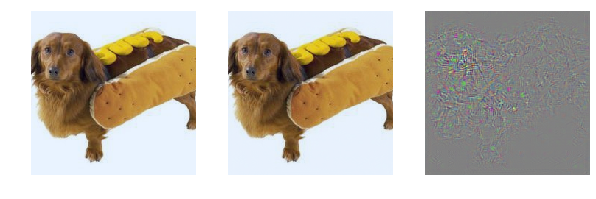

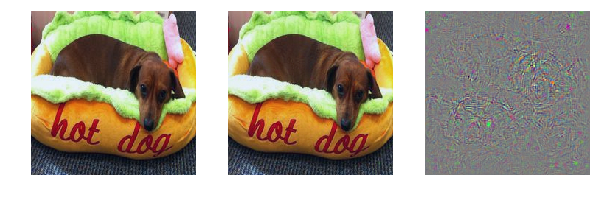

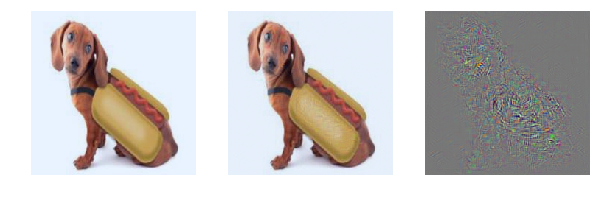

Fooling AlexNet into thinking this is a: snail
(1/100), 0.019558957137633115 confidence
(2/100), 0.023239121946971864 confidence
(3/100), 0.032051283051259816 confidence
(4/100), 0.04952908493578434 confidence
(5/100), 0.0835894315969199 confidence
(6/100), 0.15286513371393085 confidence
(7/100), 0.28514284640550613 confidence
(8/100), 0.5019161384552717 confidence
(9/100), 0.8358092047274113 confidence
(10/100), 1.480728667229414 confidence
(11/100), 2.4606432765722275 confidence
(12/100), 4.425729811191559 confidence
(13/100), 7.94164314866066 confidence
(14/100), 14.911496639251709 confidence
(15/100), 25.467264652252197 confidence
(16/100), 40.09219706058502 confidence
(17/100), 55.35386800765991 confidence
(18/100), 68.28763484954834 confidence
(19/100), 79.12495136260986 confidence
(20/100), 86.13396883010864 confidence
(21/100), 90.81857204437256 confidence
Fooling AlexNet into thinking this is a: snail
(1/100), 0.00010509878620723612 confidence
(2/100), 0.00011742810102077783 c

(10/100), 15.731361508369446 confidence
(11/100), 22.091485559940338 confidence
(12/100), 29.74608838558197 confidence
(13/100), 37.908464670181274 confidence
(14/100), 46.51176035404205 confidence
(15/100), 55.03658652305603 confidence
(16/100), 63.640040159225464 confidence
(17/100), 71.65577411651611 confidence
(18/100), 78.5935640335083 confidence
(19/100), 84.33048129081726 confidence
(20/100), 88.3608877658844 confidence
(21/100), 91.13856554031372 confidence

Left: original, middle: fooling image, right: difference magnified by 5x (gray is 0).
AlexNet will classify the middle image in each row as 'snail' with high confidence


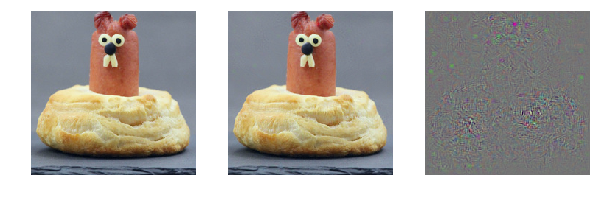

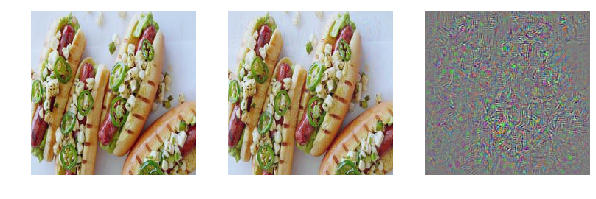

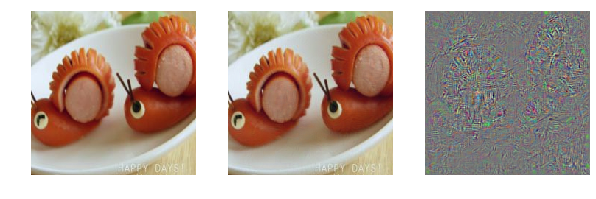

In [30]:
model = alexnet(pretrained=True)

# Set the model to eval mode
model.eval()

def make_fooling_image(image, target_class, learning_rate, regularization,
                       num_iter, momentum, threshold=0.9):
    """
    Fool AlexNet into thinking that any image has a particular class, by perturbing it just a little bit
    
    :param image: starting image CxHxW tensor
    :param target_class: the class that this will become after optimization
    :param learning_rate: either a constant, or a function that returns the learning rate at each iteration
    :param regularization: lambda parameter to multiply the regularizer
    :param num_iter: maximum number of iterations
    :param momentum: amount of momentum to use in the SGD 
    :param threshold: the target score for target_class
    """
    # Create batch dimension and turn into a variable
    image = image[np.newaxis, ...]
    
    print(f"Fooling AlexNet into thinking this is a: {labels_id2word[target_class]}")
    
    # This is the original image (used by the regularizer)
    orig_data = Variable(image.clone())
    
    image_in = Variable(image, requires_grad=True)
    velocity = torch.zeros_like(image_in)
        
    for i in range(num_iter):
        curr_scores = model(image_in)[0]
        curr_probs = F.softmax(curr_scores, 0)
        
        target_prob = curr_probs[target_class]
        target_score = curr_scores[target_class]
                
        # compute the gradient
        grad_wrt_image = fooling_image_gradient(
            target_score, orig_data, image_in, target_class, regularization)
        
        # update the image with the SGD rule
        image_in, velocity = normalized_sgd_with_momentum_update(
            image_in, grad_wrt_image, velocity, momentum, learning_rate)
        
        # Detach the image and velocity so that we don't backprop through
        # multiple iterations of the loop
        image_in = Variable(image_in.data, requires_grad = True)
        velocity = Variable(velocity.data, requires_grad = False)
        
        # Zero the gradients
        model.zero_grad()
        
        # Take the target probability out of the variable (turn it into float)
        target_prob = target_prob.data[0]
        
        # visualize the current state
        print(f"({i+1}/{num_iter}), {target_prob * 100} confidence")
        
        if target_prob > threshold:
            break
    
    delta = (image_in - orig_data).data
    return image_in, delta


num_images = 2
target_class=113
for cidx, cname in enumerate(classes):
    dataset = class_datasets[cidx]
    
    images_in = []
    fooling_images = []
    deltas = []
    
    for i, input in enumerate(dataset):
      image_in = input[0]
      label = input[1]
      
      fooling_image, delta = make_fooling_image(
          image_in,
          target_class=target_class,
          learning_rate=1e-1,
          regularization=5e-5,
          num_iter=100,
          momentum=0.9)
      
      delta = 0.5 + (5.0/255.0) * delta
    
      images_in.append(image_in)
      fooling_images.append(fooling_image)
      deltas.append(delta)
    
      if i >= num_images:
        break
        
    print ("\nLeft: original, middle: fooling image, right: difference magnified by 5x (gray is 0).\n"
        "AlexNet will classify the middle image in each row as %r with high confidence" % (
        labels_id2word[target_class]))
    show_image_rows(list(zip(images_in, fooling_images, deltas)))

# 6. Class visualization
We can visualize the knowledge inside AlexNet by starting with random noise and maximizing the probability of a certain class [2, 4]. This is similar to the idea of making a "fooling" image, except that the regularizer is a little different.

Again, we can write this as a loss $L$ depending on the image $I$: $$
L = -s_y(I) + R(I)
$$

where $$
R(I) = 0.5 \lambda \|I\|_2^2
$$$y$ is the target class, and $\lambda$ is the regularization.

[[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps", ICLR Workshop 2014.](http://arxiv.org/pdf/1312.6034.pdf)

[[4] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop](http://arxiv.org/pdf/1312.6034.pdf)

###**<font color="red">TODO 6: Implement class_visualization_gradient: compute the gradient of the loss $({\partial L \over \partial I})$**

In [31]:
model = alexnet(pretrained=True)

# Set the model to eval mode
model.eval()

def make_class_visualization(target_class, learning_rate, regularization, num_iter,
                             max_jitter, blur_sigma, momentum):
    """
    Visualize an ILSVRC2012 class by maximizing the probability of that class, starting from random.
    
    :param target_class: what ILSVRC2012 class to visualize
    :param learning_rate: either a constant, or a function that returns the learning rate at each iteration
    :param regularization: lambda parameter to multiply the regularizer
    :param num_iter: number of iterations
    :param max_jitter: amount of jitter to add for regularization
    :param blur_sigma: blur each iteration by this amount.
    :param momentum: amount of momentum to use in the SGD update
    """
    
    image_np = 100 * np.random.randn(1, 3, 224, 224).astype(np.float32)
    vel_np = np.zeros_like(image_np)
    
    print(f"Generating visualization of: {labels_id2word[target_class]}...")
    
    for i in range(num_iter):
        # Random jitter to regularize
        ox, oy = np.random.randint(-max_jitter, max_jitter+1, 2)
        
        image_np = np.roll(np.roll(image_np, ox, -1), oy, -2)
        vel_np = np.roll(np.roll(vel_np, ox, -1), oy, -2)
        
        image = Variable(torch.from_numpy(image_np), requires_grad=True)
        velocity = Variable(torch.from_numpy(vel_np), requires_grad=False)
        
        # Compute the current class score
        class_scores = model(image)[0]
        class_probs = F.softmax(class_scores, 0)
        
        target_score = class_scores[target_class]
        target_prob = class_probs[target_class]
                
        # Compute the gradient
        grad = class_visualization_gradient(
            target_score, image, target_class, regularization)
        
        # Normalized SGD+Momentum update
        image, velocity = normalized_sgd_with_momentum_update(
            image, grad, velocity, momentum, learning_rate)
        
        # Convert back to numpy
        image_np = image.data.cpu().numpy()
        vel_np = velocity.data.cpu().numpy()
        
        # Undo jitter
        image_np = np.roll(np.roll(image_np, -ox, -1), -oy, -2)
        vel_np = np.roll(np.roll(vel_np, -ox, -1), -oy, -2)
        
        # blur the image every iteration
        for c in range(3):
            image_np[0, c, ...] = gaussian_filter(image_np[0, c, ...], sigma=blur_sigma)
        
        # Convert to float
        target_prob = target_prob.data[0]
        target_score = target_score.data[0]
        
        # Visualize our current result
        print(f"({i+1}/{num_iter}), {target_prob * 100} % confidence, score: {target_score}")
    
    return torch.from_numpy(image_np)[0]

Loading pre-trained weights from model zoo


## Generate images!
Use make_class_visualization to visualize an example Flamingo or Tarantula. You can play around with the hyperparameters or generate new classes, but you must at least generate a Flamingo or Tarantula.

The list of classes is in ~/caffe/data/ilsvrc12/synset_words.txt (this is downloaded in a cell above).

Generating visualization of: flamingo...
(1/250), 0.0 % confidence, score: 84.68738555908203
(2/250), 0.0 % confidence, score: 68.3775405883789
(3/250), 0.0 % confidence, score: 91.45124053955078
(4/250), 0.0 % confidence, score: 82.7882308959961
(5/250), 0.0 % confidence, score: 102.6973876953125
(6/250), 0.0 % confidence, score: 113.98507690429688
(7/250), 0.0 % confidence, score: 122.48355865478516
(8/250), 0.0 % confidence, score: 117.01493072509766
(9/250), 0.0 % confidence, score: 133.8103790283203
(10/250), 0.0 % confidence, score: 139.71014404296875
(11/250), 0.0 % confidence, score: 132.15711975097656
(12/250), 0.0 % confidence, score: 169.2626953125
(13/250), 0.0 % confidence, score: 172.22901916503906
(14/250), 0.0 % confidence, score: 194.4164581298828
(15/250), 0.0 % confidence, score: 206.12315368652344
(16/250), 0.0 % confidence, score: 237.93629455566406
(17/250), 0.0 % confidence, score: 258.32720947265625
(18/250), 0.0 % confidence, score: 287.1365051269531
(19/250), 

(60/250), 100.0 % confidence, score: 4370.6201171875
(61/250), 100.0 % confidence, score: 4673.00634765625
(62/250), 100.0 % confidence, score: 4747.48681640625
(63/250), 100.0 % confidence, score: 5820.02880859375
(64/250), 100.0 % confidence, score: 6519.8662109375
(65/250), 100.0 % confidence, score: 6532.06494140625
(66/250), 100.0 % confidence, score: 6362.99853515625
(67/250), 100.0 % confidence, score: 5267.8408203125
(68/250), 100.0 % confidence, score: 5495.05908203125
(69/250), 100.0 % confidence, score: 6984.7861328125
(70/250), 100.0 % confidence, score: 6978.28857421875
(71/250), 100.0 % confidence, score: 7033.8857421875
(72/250), 100.0 % confidence, score: 6410.7431640625
(73/250), 100.0 % confidence, score: 6986.466796875
(74/250), 100.0 % confidence, score: 9120.9384765625
(75/250), 100.0 % confidence, score: 7313.35595703125
(76/250), 100.0 % confidence, score: 8403.1328125
(77/250), 100.0 % confidence, score: 7893.04541015625
(78/250), 100.0 % confidence, score: 8572

(120/250), 100.0 % confidence, score: 15828.1533203125
(121/250), 100.0 % confidence, score: 13573.4404296875
(122/250), 100.0 % confidence, score: 16126.2744140625
(123/250), 100.0 % confidence, score: 14366.6240234375
(124/250), 100.0 % confidence, score: 15766.146484375
(125/250), 100.0 % confidence, score: 18933.6875
(126/250), 100.0 % confidence, score: 14575.2333984375
(127/250), 100.0 % confidence, score: 19714.11328125
(128/250), 100.0 % confidence, score: 15287.546875
(129/250), 100.0 % confidence, score: 17145.994140625
(130/250), 100.0 % confidence, score: 19420.19921875
(131/250), 100.0 % confidence, score: 17872.33203125
(132/250), 100.0 % confidence, score: 16026.669921875
(133/250), 100.0 % confidence, score: 15668.6708984375
(134/250), 100.0 % confidence, score: 17060.74609375
(135/250), 100.0 % confidence, score: 17791.6171875
(136/250), 100.0 % confidence, score: 18929.078125
(137/250), 100.0 % confidence, score: 16814.1015625
(138/250), 100.0 % confidence, score: 213

(181/250), 100.0 % confidence, score: 19986.314453125
(182/250), 100.0 % confidence, score: 18358.89453125
(183/250), 100.0 % confidence, score: 25089.171875
(184/250), 100.0 % confidence, score: 23472.7265625
(185/250), 100.0 % confidence, score: 22012.265625
(186/250), 100.0 % confidence, score: 24219.2265625
(187/250), 100.0 % confidence, score: 22092.35546875
(188/250), 100.0 % confidence, score: 22133.2421875
(189/250), 100.0 % confidence, score: 22424.6796875
(190/250), 100.0 % confidence, score: 21105.923828125
(191/250), 100.0 % confidence, score: 22215.63671875
(192/250), 100.0 % confidence, score: 23265.01953125
(193/250), 100.0 % confidence, score: 22925.46875
(194/250), 100.0 % confidence, score: 22404.392578125
(195/250), 100.0 % confidence, score: 22932.48828125
(196/250), 100.0 % confidence, score: 22866.79296875
(197/250), 100.0 % confidence, score: 22806.16796875
(198/250), 100.0 % confidence, score: 21752.20703125
(199/250), 100.0 % confidence, score: 21339.228515625


(242/250), 100.0 % confidence, score: 25754.908203125
(243/250), 100.0 % confidence, score: 21343.587890625
(244/250), 100.0 % confidence, score: 27072.494140625
(245/250), 100.0 % confidence, score: 24121.47265625
(246/250), 100.0 % confidence, score: 28362.03125
(247/250), 100.0 % confidence, score: 25969.404296875
(248/250), 100.0 % confidence, score: 23724.4140625
(249/250), 100.0 % confidence, score: 23558.36328125
(250/250), 100.0 % confidence, score: 28284.552734375


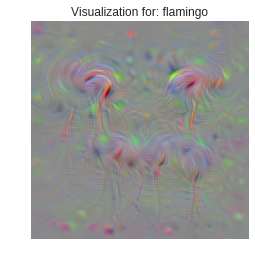

In [32]:
target_class = 130 # flamingo
image = make_class_visualization(
    target_class=target_class,
    learning_rate=200,
    regularization=1e-7,
    num_iter=250,
    max_jitter=5,
    blur_sigma=0.4,
    momentum=0.9,
)

show_image(image, f"Visualization for: {labels_id2word[target_class]}")

Generating visualization of: tarantula...
(1/250), 0.0 % confidence, score: -8.736236572265625
(2/250), 0.0 % confidence, score: -14.938142776489258
(3/250), 0.0 % confidence, score: -14.194160461425781
(4/250), 0.0 % confidence, score: -20.122802734375
(5/250), 0.0 % confidence, score: -16.518760681152344
(6/250), 0.0 % confidence, score: -1.5435277223587036
(7/250), 0.0 % confidence, score: 10.82016372680664
(8/250), 0.0 % confidence, score: 10.202411651611328
(9/250), 0.0 % confidence, score: 30.414819717407227
(10/250), 0.0 % confidence, score: 61.72759246826172
(11/250), 0.0 % confidence, score: 92.44208526611328
(12/250), 0.0 % confidence, score: 30.164485931396484
(13/250), 0.0 % confidence, score: 62.25229263305664
(14/250), 0.0 % confidence, score: 77.70545196533203
(15/250), 0.0 % confidence, score: 79.8124771118164
(16/250), 5.901288830862532e-32 % confidence, score: 126.7106704711914
(17/250), 4.646705707701093e-40 % confidence, score: 94.97020721435547
(18/250), 1.04957254

(58/250), 0.0 % confidence, score: 1445.1898193359375
(59/250), 1.4163753674958445e-31 % confidence, score: 1149.5513916015625
(60/250), 0.0 % confidence, score: 1041.123779296875
(61/250), 0.0 % confidence, score: 1461.7137451171875
(62/250), 0.0 % confidence, score: 1438.0184326171875
(63/250), 0.0 % confidence, score: 1575.6771240234375
(64/250), 0.0 % confidence, score: 1740.3218994140625
(65/250), 0.0 % confidence, score: 1586.9410400390625
(66/250), 0.0 % confidence, score: 1694.267578125
(67/250), 1.6911742712179715e-20 % confidence, score: 1668.7825927734375
(68/250), 0.0 % confidence, score: 1821.0592041015625
(69/250), 1.958430268190216e-33 % confidence, score: 2003.9461669921875
(70/250), 0.0 % confidence, score: 1891.8402099609375
(71/250), 0.0 % confidence, score: 1841.92626953125
(72/250), 7.662165173172308e-10 % confidence, score: 2089.643310546875
(73/250), 1.2729811449696535e-25 % confidence, score: 2038.3702392578125
(74/250), 1.0846056041138863e-10 % confidence, scor

(115/250), 100.0 % confidence, score: 3822.6572265625
(116/250), 100.0 % confidence, score: 3837.26220703125
(117/250), 100.0 % confidence, score: 3787.75830078125
(118/250), 5.536169931292534 % confidence, score: 3901.84326171875
(119/250), 100.0 % confidence, score: 3881.877685546875
(120/250), 100.0 % confidence, score: 4273.62841796875
(121/250), 100.0 % confidence, score: 4054.762939453125
(122/250), 100.0 % confidence, score: 4443.18896484375
(123/250), 4.2618590954095067e-16 % confidence, score: 4042.24755859375
(124/250), 6.95646596644769e-39 % confidence, score: 4215.5341796875
(125/250), 100.0 % confidence, score: 4518.13720703125
(126/250), 100.0 % confidence, score: 4579.55810546875
(127/250), 100.0 % confidence, score: 3522.38671875
(128/250), 100.0 % confidence, score: 3835.64990234375
(129/250), 100.0 % confidence, score: 4240.15283203125
(130/250), 100.0 % confidence, score: 4633.10107421875
(131/250), 100.0 % confidence, score: 4670.54736328125
(132/250), 100.0 % confi

(174/250), 100.0 % confidence, score: 6375.04736328125
(175/250), 100.0 % confidence, score: 5451.70263671875
(176/250), 100.0 % confidence, score: 6374.53466796875
(177/250), 100.0 % confidence, score: 5554.24658203125
(178/250), 100.0 % confidence, score: 6679.03564453125
(179/250), 100.0 % confidence, score: 6152.1748046875
(180/250), 100.0 % confidence, score: 6833.19775390625
(181/250), 100.0 % confidence, score: 6574.84814453125
(182/250), 100.0 % confidence, score: 6385.69384765625
(183/250), 100.0 % confidence, score: 6395.90771484375
(184/250), 100.0 % confidence, score: 7098.34130859375
(185/250), 100.0 % confidence, score: 6737.96240234375
(186/250), 100.0 % confidence, score: 6696.94189453125
(187/250), 100.0 % confidence, score: 5952.330078125
(188/250), 100.0 % confidence, score: 6188.79736328125
(189/250), 100.0 % confidence, score: 7023.61083984375
(190/250), 100.0 % confidence, score: 7024.89404296875
(191/250), 100.0 % confidence, score: 6663.43408203125
(192/250), 10

(233/250), 100.0 % confidence, score: 8507.7763671875
(234/250), 100.0 % confidence, score: 8295.0830078125
(235/250), 100.0 % confidence, score: 8191.01416015625
(236/250), 100.0 % confidence, score: 7386.85107421875
(237/250), 100.0 % confidence, score: 8722.5068359375
(238/250), 100.0 % confidence, score: 8522.607421875
(239/250), 100.0 % confidence, score: 8459.0576171875
(240/250), 100.0 % confidence, score: 8609.2919921875
(241/250), 100.0 % confidence, score: 8431.8330078125
(242/250), 100.0 % confidence, score: 8458.5615234375
(243/250), 100.0 % confidence, score: 9661.119140625
(244/250), 100.0 % confidence, score: 8687.1611328125
(245/250), 100.0 % confidence, score: 9293.9970703125
(246/250), 100.0 % confidence, score: 7376.44580078125
(247/250), 100.0 % confidence, score: 7489.45068359375
(248/250), 100.0 % confidence, score: 8707.9833984375
(249/250), 100.0 % confidence, score: 8651.0888671875
(250/250), 100.0 % confidence, score: 8844.5419921875


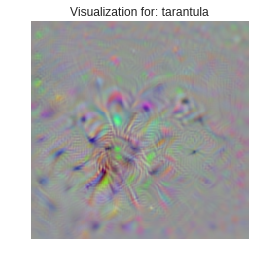

In [33]:
target_class = 76 # tarantula
image = make_class_visualization(
    target_class=target_class,
    learning_rate=200,
    regularization=1e-7,
    num_iter=250,
    max_jitter=5,
    blur_sigma=0.4,
    momentum=0.9,
)

show_image(image, f"Visualization for: {labels_id2word[target_class]}")

In [0]:
# Try other classes here

# 7. Feature Inversion
Instead of generating new examples, we can try and reconstruct examples starting from the hidden representation of a single layer [5]. While [4] and [5] use better regularizers, we are going to use a simple L2 regularizer.

Concretely, given a image $I$, let $\phi_\ell(I)$ be the activations at layer $\ell$ of the convolutional network $\phi$. We wish to find an image $I$ with a similar feature representation as $I'$ at layer $\ell$ of the network $\phi$ by solving the optimization problem

$$
L = (0.5/M) \|\phi_\ell(I) - \phi_\ell(I')\|_2^2 + R(I)
$$

where $\|\cdot\|_2^2$ is the squared Euclidean norm, and $M$ is the number of entries in $\phi_\ell(I)$.  $M$ was added to make it easier to set $\lambda$, and  $R(I)$ is a regularizer. We can solve this optimization problem using gradient descent (with momentum), computing gradients with respect to the generated image. We will use L2 regularization of the form:

$$
R(I) = 0.5 \lambda \|I\|_2^2
$$

To improve the reconstruction quality, we will blur the image every few iterations, which is like adding an implicit regularizer to the optimization.

[5] Aravindh Mahendran, Andrea Vedaldi, "Understanding Deep Image Representations by Inverting them", CVPR 2015

[4] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop

###**<font color="red">TODO 7a: Implement feature_inversion_gradient, which computes the gradient of the above loss function with respect to the image, ${\partial L \over \partial I}$.</font>**

In [0]:
activations = None

def make_feature_inversion(image, layer_name, variable_learning_rate, regularization,
                           num_iter, blur_every, momentum):
    """
    Solve for a feature inversion for a given filename, by reconstructing from a certain layer (blob_name).
    :param image: FloatTensor of shape (3, 224, 224)
    :param variable_learning_rate: (int -> float) a function  that returns the learning rate at each iteration
    :param regularization: lambda parameter to multiply the regularizer
    :param num_iter: number of iterations
    :param blur_every: how many iterations to wait between blurring the image
    :param momentum: amount of momentum to use in the SGD update
    """
    
    model = alexnet(pretrained=True)
    
    # Define a hook that will capture the activations from the required layer
    def grab_activations_hook(module, input, output):
      print("Captured activations")
      global activations
      activations = output
    model.module_shortcuts[layer_name].register_forward_hook(grab_activations_hook)
    
    image = Variable(image.unsqueeze(0))
    
    class_scores = model(image)[0]
    
    # target feature value
    global activations
    target_feat = Variable(activations.data.clone())
    activations = None
    
    # start out with random gaussian noise
    data_np = 20 * np.random.randn(1, 3, 224, 224).astype(np.float32)
    
    # momentum velocity
    vel_np = np.zeros_like(data_np)
    
    print(f"Inverting features")
    
    for i in range(num_iter):
      
        data_in = Variable(torch.from_numpy(data_np), requires_grad=True)
        velocity = Variable(torch.from_numpy(vel_np), requires_grad=False)
      
        class_scores = model(data_in)[0]
        
        # learning rate: allow it to vary
        lr = variable_learning_rate(i)
        
        # current feature value
        cur_feat = activations[0].clone()
        activations = None
        
        grad, loss, loss_target, loss_reg = feature_inversion_gradient(
          data_in, target_feat, cur_feat, regularization
        )
        
        model.zero_grad()
                
        # Normalized SGD+Momentum update
        data_in, velocity = normalized_sgd_with_momentum_update(
            data_in.data, grad.data, velocity.data, momentum, lr)
                
        data_np = data_in.cpu().numpy()
        vel_np = velocity.cpu().numpy()
        
        # Periodically blur the image
        if i > 0 and i < num_iter - 1 and (i % blur_every) == 0:
            # Blur each color channel separately
            for c in range(3):
                data_np[0, c, ...] = gaussian_filter(data_np[0, c, ...], sigma=0.5)

        print(f"({i+1}/{num_iter}) Layer name: {layer_name}, learning_rate: {lr}, loss: {loss} ({loss_target} target + {loss_reg} reg)")        
    
    return data_in[0]

**Original image**

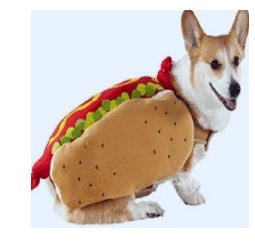

In [34]:
image, label = full_dataset[10]
show_image(image)

#### ** Reconstructed images**

HINT: If you read the paper by Mahendran and Vedaldi, you'll see that reconstructions from deep features tend not to look much like the original image, so you shouldn't expect the results to look like the reconstruction above. You should be able to get an image that shows some discernable structure within 100-1000 iterations.

conv1 should look pretty close to the original image.  conv1 should be pretty fast to compute (several iterations per second), but the later layers will be slower (1-5 seconds per iteration).

When debugging, we recommend making sure that conv1 works before trying the other layers.

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/200) Layer name: conv1, learning_rate: 1000.0, loss: 2977369.75 (2977369.5 target + 0.3007783889770508 reg)
Captured activations
(2/200) Layer name: conv1, learning_rate: 990.0498337491681, loss: 1577529.0 (1577528.75 target + 0.2714345157146454 reg)
Captured activations
(3/200) Layer name: conv1, learning_rate: 980.1986733067553, loss: 551389.1875 (551388.9375 target + 0.23900583386421204 reg)
Captured activations
(4/200) Layer name: conv1, learning_rate: 970.4455335485081, loss: 729049.875 (729049.625 target + 0.22701530158519745 reg)
Captured activations
(5/200) Layer name: conv1, learning_rate: 960.7894391523232, loss: 1120405.5 (1120405.25 target + 0.22753365337848663 reg)
Captured activations
(6/200) Layer name: conv1, learning_rate: 951.229424500714, loss: 1090890.0 (1090889.75 target + 0.2229927033185959 reg)
Captured activations
(7/200) Layer name: conv1, learning_rate: 9

(62/200) Layer name: conv1, learning_rate: 543.3508690744998, loss: 13562.4267578125 (13562.423828125 target + 0.0027871355414390564 reg)
Captured activations
(63/200) Layer name: conv1, learning_rate: 537.9444375946745, loss: 15138.146484375 (15138.1435546875 target + 0.002827038988471031 reg)
Captured activations
(64/200) Layer name: conv1, learning_rate: 532.5918010068972, loss: 11773.4580078125 (11773.455078125 target + 0.0027876461390405893 reg)
Captured activations
(65/200) Layer name: conv1, learning_rate: 527.2924240430485, loss: 15069.53515625 (15069.5322265625 target + 0.0028026828076690435 reg)
Captured activations
(66/200) Layer name: conv1, learning_rate: 522.0457767610161, loss: 11430.8466796875 (11430.84375 target + 0.0027677202597260475 reg)
Captured activations
(67/200) Layer name: conv1, learning_rate: 516.8513344916992, loss: 12728.3427734375 (12728.33984375 target + 0.002747891005128622 reg)
Captured activations
(68/200) Layer name: conv1, learning_rate: 511.7085777

(122/200) Layer name: conv1, learning_rate: 298.1972794298874, loss: 4013.102294921875 (4013.099609375 target + 0.00262288935482502 reg)
Captured activations
(123/200) Layer name: conv1, learning_rate: 295.2301669240142, loss: 3965.0703125 (3965.067626953125 target + 0.0026365364901721478 reg)
Captured activations
(124/200) Layer name: conv1, learning_rate: 292.29257768085944, loss: 3791.882568359375 (3791.8798828125 target + 0.002642241306602955 reg)
Captured activations
(125/200) Layer name: conv1, learning_rate: 289.3842179390506, loss: 3914.37158203125 (3914.368896484375 target + 0.002638936974108219 reg)
Captured activations
(126/200) Layer name: conv1, learning_rate: 286.5047968601901, loss: 3502.384521484375 (3502.3818359375 target + 0.002635068027302623 reg)
Captured activations
(127/200) Layer name: conv1, learning_rate: 283.6540264997704, loss: 3653.978515625 (3653.975830078125 target + 0.002619531936943531 reg)
Captured activations
(128/200) Layer name: conv1, learning_rate:

(179/200) Layer name: conv1, learning_rate: 168.6381472685955, loss: 1275.2547607421875 (1275.252197265625 target + 0.002621128223836422 reg)
Captured activations
(180/200) Layer name: conv1, learning_rate: 166.9601696670407, loss: 1363.61181640625 (1363.6092529296875 target + 0.0026210667565464973 reg)
Captured activations
(181/200) Layer name: conv1, learning_rate: 165.29888822158654, loss: 1071.376708984375 (1071.3741455078125 target + 0.002616081852465868 reg)
Captured activations
(182/200) Layer name: conv1, learning_rate: 163.65413680270404, loss: 1351.44482421875 (1351.4422607421875 target + 0.0026035259943455458 reg)
Captured activations
(183/200) Layer name: conv1, learning_rate: 162.02575093388074, loss: 1290.41943359375 (1290.4168701171875 target + 0.0026158359833061695 reg)
Captured activations
(184/200) Layer name: conv1, learning_rate: 160.41356777517274, loss: 1123.5166015625 (1123.5140380859375 target + 0.002620663959532976 reg)
Captured activations
(185/200) Layer name

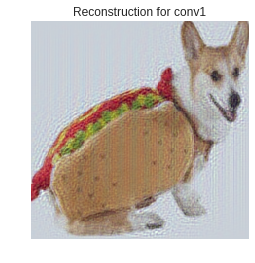

In [35]:
LAYER_NAME = "conv1"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 1000.0 * np.exp(-i/100.0),
           regularization=1e-8,
           num_iter=200,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/200) Layer name: conv2, learning_rate: 1000.0, loss: 48835548.0 (48835548.0 target + 0.2995186746120453 reg)
Captured activations
(2/200) Layer name: conv2, learning_rate: 990.0498337491681, loss: 23588040.0 (23588040.0 target + 0.2779194712638855 reg)
Captured activations
(3/200) Layer name: conv2, learning_rate: 980.1986733067553, loss: 12102699.0 (12102699.0 target + 0.2551339864730835 reg)
Captured activations
(4/200) Layer name: conv2, learning_rate: 970.4455335485081, loss: 13945796.0 (13945796.0 target + 0.24678990244865417 reg)
Captured activations
(5/200) Layer name: conv2, learning_rate: 960.7894391523232, loss: 16895236.0 (16895236.0 target + 0.2476152628660202 reg)
Captured activations
(6/200) Layer name: conv2, learning_rate: 951.229424500714, loss: 16525832.0 (16525832.0 target + 0.2492986023426056 reg)
Captured activations
(7/200) Layer name: conv2, learning_rate: 9

(50/200) Layer name: conv2, learning_rate: 612.6263941844161, loss: 1327305.0 (1327305.0 target + 0.048626430332660675 reg)
Captured activations
(51/200) Layer name: conv2, learning_rate: 606.5306597126335, loss: 1304389.75 (1304389.75 target + 0.054302047938108444 reg)
Captured activations
(52/200) Layer name: conv2, learning_rate: 600.4955788122659, loss: 848791.4375 (848791.4375 target + 0.029958445578813553 reg)
Captured activations
(53/200) Layer name: conv2, learning_rate: 594.5205479701943, loss: 1085859.5 (1085859.5 target + 0.034287985414266586 reg)
Captured activations
(54/200) Layer name: conv2, learning_rate: 588.6049696783551, loss: 1227574.875 (1227574.875 target + 0.039248276501894 reg)
Captured activations
(55/200) Layer name: conv2, learning_rate: 582.7482523739897, loss: 1204489.0 (1204489.0 target + 0.04425498843193054 reg)
Captured activations
(56/200) Layer name: conv2, learning_rate: 576.9498103804866, loss: 1167213.125 (1167213.125 target + 0.04934444651007652 re

(101/200) Layer name: conv2, learning_rate: 367.87944117144235, loss: 460430.15625 (460430.125 target + 0.020139895379543304 reg)
Captured activations
(102/200) Layer name: conv2, learning_rate: 364.21897957152333, loss: 317255.5 (317255.5 target + 0.011280667036771774 reg)
Captured activations
(103/200) Layer name: conv2, learning_rate: 360.5949401730783, loss: 398316.8125 (398316.8125 target + 0.012860394082963467 reg)
Captured activations
(104/200) Layer name: conv2, learning_rate: 357.0069605691474, loss: 439142.84375 (439142.84375 target + 0.014633478596806526 reg)
Captured activations
(105/200) Layer name: conv2, learning_rate: 353.45468195878016, loss: 421519.375 (421519.34375 target + 0.016436539590358734 reg)
Captured activations
(106/200) Layer name: conv2, learning_rate: 349.9377491111553, loss: 424281.90625 (424281.875 target + 0.018309490755200386 reg)
Captured activations
(107/200) Layer name: conv2, learning_rate: 346.4558103300574, loss: 287307.375 (287307.375 target + 

Captured activations
(153/200) Layer name: conv2, learning_rate: 218.71188695221474, loss: 130987.6328125 (130987.625 target + 0.00532176299020648 reg)
Captured activations
(154/200) Layer name: conv2, learning_rate: 216.53566731600708, loss: 150810.984375 (150810.984375 target + 0.005975994747132063 reg)
Captured activations
(155/200) Layer name: conv2, learning_rate: 214.38110142697795, loss: 149083.734375 (149083.734375 target + 0.0066357143223285675 reg)
Captured activations
(156/200) Layer name: conv2, learning_rate: 212.24797382674305, loss: 139100.21875 (139100.21875 target + 0.0073045725002884865 reg)
Captured activations
(157/200) Layer name: conv2, learning_rate: 210.13607120076472, loss: 95418.1953125 (95418.1875 target + 0.00439398642629385 reg)
Captured activations
(158/200) Layer name: conv2, learning_rate: 208.04518235702045, loss: 111891.8203125 (111891.8125 target + 0.00490761362016201 reg)
Captured activations
(159/200) Layer name: conv2, learning_rate: 205.9750982048

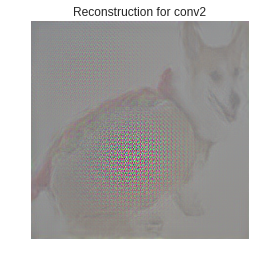

In [37]:
LAYER_NAME = "conv2"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 1000.0 * np.exp(-i/100.0),
           regularization=1e-8,
           num_iter=200,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/1000) Layer name: conv3, learning_rate: 100.0, loss: 2381169.25 (2381166.25 target + 3.0179243087768555 reg)
Captured activations
(2/1000) Layer name: conv3, learning_rate: 99.0049833749168, loss: 1842449.75 (1842446.75 target + 3.011057138442993 reg)
Captured activations
(3/1000) Layer name: conv3, learning_rate: 98.01986733067552, loss: 1227462.125 (1227459.125 target + 2.9991607666015625 reg)
Captured activations
(4/1000) Layer name: conv3, learning_rate: 97.04455335485082, loss: 761854.6875 (761851.6875 target + 2.985104560852051 reg)
Captured activations
(5/1000) Layer name: conv3, learning_rate: 96.07894391523232, loss: 467674.09375 (467671.125 target + 2.971945285797119 reg)
Captured activations
(6/1000) Layer name: conv3, learning_rate: 95.1229424500714, loss: 294663.34375 (294660.375 target + 2.9621829986572266 reg)
Captured activations
(7/1000) Layer name: conv3, learnin

(50/1000) Layer name: conv3, learning_rate: 61.26263941844161, loss: 16478.84375 (16478.48046875 target + 0.36418551206588745 reg)
Captured activations
(51/1000) Layer name: conv3, learning_rate: 60.653065971263345, loss: 14855.1123046875 (14854.7412109375 target + 0.3711194097995758 reg)
Captured activations
(52/1000) Layer name: conv3, learning_rate: 60.04955788122659, loss: 17939.580078125 (17939.251953125 target + 0.328044056892395 reg)
Captured activations
(53/1000) Layer name: conv3, learning_rate: 59.452054797019436, loss: 15224.7333984375 (15224.400390625 target + 0.3333846926689148 reg)
Captured activations
(54/1000) Layer name: conv3, learning_rate: 58.860496967835516, loss: 14167.5732421875 (14167.234375 target + 0.33892664313316345 reg)
Captured activations
(55/1000) Layer name: conv3, learning_rate: 58.274825237398964, loss: 13819.7578125 (13819.4130859375 target + 0.34471988677978516 reg)
Captured activations
(56/1000) Layer name: conv3, learning_rate: 57.69498103804867, 

(98/1000) Layer name: conv3, learning_rate: 37.90830381033988, loss: 10541.03125 (10540.826171875 target + 0.20467112958431244 reg)
Captured activations
(99/1000) Layer name: conv3, learning_rate: 37.531109885139955, loss: 11306.033203125 (11305.8271484375 target + 0.2062816023826599 reg)
Captured activations
(100/1000) Layer name: conv3, learning_rate: 37.15766910220457, loss: 11351.1123046875 (11350.904296875 target + 0.2079983502626419 reg)
Captured activations
(101/1000) Layer name: conv3, learning_rate: 36.787944117144235, loss: 10578.4521484375 (10578.2421875 target + 0.2096959501504898 reg)
Captured activations
(102/1000) Layer name: conv3, learning_rate: 36.42189795715233, loss: 15655.1611328125 (15654.96875 target + 0.19210028648376465 reg)
Captured activations
(103/1000) Layer name: conv3, learning_rate: 36.05949401730783, loss: 12031.560546875 (12031.3671875 target + 0.19338199496269226 reg)
Captured activations
(104/1000) Layer name: conv3, learning_rate: 35.70069605691474,

(146/1000) Layer name: conv3, learning_rate: 23.457028809379764, loss: 8088.5361328125 (8088.4091796875 target + 0.12713328003883362 reg)
Captured activations
(147/1000) Layer name: conv3, learning_rate: 23.223627472975885, loss: 9181.1220703125 (9181.00390625 target + 0.11842943727970123 reg)
Captured activations
(148/1000) Layer name: conv3, learning_rate: 22.992548518672386, loss: 8427.9638671875 (8427.8447265625 target + 0.11878389120101929 reg)
Captured activations
(149/1000) Layer name: conv3, learning_rate: 22.763768838381274, loss: 7917.77880859375 (7917.65966796875 target + 0.11913122981786728 reg)
Captured activations
(150/1000) Layer name: conv3, learning_rate: 22.53726555394387, loss: 8578.689453125 (8578.5703125 target + 0.11958056688308716 reg)
Captured activations
(151/1000) Layer name: conv3, learning_rate: 22.313016014842983, loss: 8397.5185546875 (8397.3984375 target + 0.12004927545785904 reg)
Captured activations
(152/1000) Layer name: conv3, learning_rate: 22.090997

(194/1000) Layer name: conv3, learning_rate: 14.514819848362373, loss: 5967.66748046875 (5967.59326171875 target + 0.07421156018972397 reg)
Captured activations
(195/1000) Layer name: conv3, learning_rate: 14.370394977770292, loss: 6039.53466796875 (6039.46044921875 target + 0.07433240115642548 reg)
Captured activations
(196/1000) Layer name: conv3, learning_rate: 14.227407158651358, loss: 5965.154296875 (5965.07958984375 target + 0.07447173446416855 reg)
Captured activations
(197/1000) Layer name: conv3, learning_rate: 14.0858420921045, loss: 6175.3037109375 (6175.2333984375 target + 0.07043161243200302 reg)
Captured activations
(198/1000) Layer name: conv3, learning_rate: 13.945685621505094, loss: 6008.5595703125 (6008.4892578125 target + 0.07053263485431671 reg)
Captured activations
(199/1000) Layer name: conv3, learning_rate: 13.806923731089283, loss: 5815.66943359375 (5815.5986328125 target + 0.07060958445072174 reg)
Captured activations
(200/1000) Layer name: conv3, learning_rate

(242/1000) Layer name: conv3, learning_rate: 8.981529457224763, loss: 5192.93408203125 (5192.88720703125 target + 0.046941161155700684 reg)
Captured activations
(243/1000) Layer name: conv3, learning_rate: 8.892161745938635, loss: 4986.1015625 (4986.0546875 target + 0.04701190069317818 reg)
Captured activations
(244/1000) Layer name: conv3, learning_rate: 8.803683258237255, loss: 4910.2197265625 (4910.1728515625 target + 0.04706713557243347 reg)
Captured activations
(245/1000) Layer name: conv3, learning_rate: 8.71608514619813, loss: 4912.61474609375 (4912.56787109375 target + 0.04710450768470764 reg)
Captured activations
(246/1000) Layer name: conv3, learning_rate: 8.62935864993705, loss: 4886.66455078125 (4886.6171875 target + 0.04716954007744789 reg)
Captured activations
(247/1000) Layer name: conv3, learning_rate: 8.543495096732123, loss: 5147.44189453125 (5147.39697265625 target + 0.04509975388646126 reg)
Captured activations
(248/1000) Layer name: conv3, learning_rate: 8.45848590

(290/1000) Layer name: conv3, learning_rate: 5.557621261148306, loss: 4227.81103515625 (4227.77734375 target + 0.03388892859220505 reg)
Captured activations
(291/1000) Layer name: conv3, learning_rate: 5.502322005640723, loss: 4205.73193359375 (4205.6982421875 target + 0.03392350301146507 reg)
Captured activations
(292/1000) Layer name: conv3, learning_rate: 5.447572986918986, loss: 4539.9052734375 (4539.87255859375 target + 0.03263358399271965 reg)
Captured activations
(293/1000) Layer name: conv3, learning_rate: 5.3933687300356015, loss: 4304.89599609375 (4304.86328125 target + 0.032670896500349045 reg)
Captured activations
(294/1000) Layer name: conv3, learning_rate: 5.339703814519709, loss: 4172.36865234375 (4172.3359375 target + 0.032726384699344635 reg)
Captured activations
(295/1000) Layer name: conv3, learning_rate: 5.286572873835037, loss: 4134.88623046875 (4134.853515625 target + 0.03277772292494774 reg)
Captured activations
(296/1000) Layer name: conv3, learning_rate: 5.2339

(338/1000) Layer name: conv3, learning_rate: 3.4389637343472708, loss: 3705.59423828125 (3705.5693359375 target + 0.024961235001683235 reg)
Captured activations
(339/1000) Layer name: conv3, learning_rate: 3.4047454734599345, loss: 3575.69140625 (3575.66650390625 target + 0.024999156594276428 reg)
Captured activations
(340/1000) Layer name: conv3, learning_rate: 3.3708676899572394, loss: 3608.76806640625 (3608.742919921875 target + 0.025047915056347847 reg)
Captured activations
(341/1000) Layer name: conv3, learning_rate: 3.337326996032608, loss: 3636.732177734375 (3636.70703125 target + 0.025085581466555595 reg)
Captured activations
(342/1000) Layer name: conv3, learning_rate: 3.304120037588693, loss: 3753.717041015625 (3753.69287109375 target + 0.024278685450553894 reg)
Captured activations
(343/1000) Layer name: conv3, learning_rate: 3.2712434939019817, loss: 3630.817138671875 (3630.792724609375 target + 0.024302678182721138 reg)
Captured activations
(344/1000) Layer name: conv3, le

(386/1000) Layer name: conv3, learning_rate: 2.127973643837717, loss: 3195.9794921875 (3195.95947265625 target + 0.020117245614528656 reg)
Captured activations
(387/1000) Layer name: conv3, learning_rate: 2.106799952304143, loss: 3368.27783203125 (3368.25830078125 target + 0.01955452375113964 reg)
Captured activations
(388/1000) Layer name: conv3, learning_rate: 2.0858369425214716, loss: 3252.517333984375 (3252.497802734375 target + 0.019577858969569206 reg)
Captured activations
(389/1000) Layer name: conv3, learning_rate: 2.0650825181712564, loss: 3142.4208984375 (3142.4013671875 target + 0.01960965245962143 reg)
Captured activations
(390/1000) Layer name: conv3, learning_rate: 2.0445346037937653, loss: 3140.5341796875 (3140.5146484375 target + 0.019649488851428032 reg)
Captured activations
(391/1000) Layer name: conv3, learning_rate: 2.0241911445804392, loss: 3162.709228515625 (3162.689453125 target + 0.019682956859469414 reg)
Captured activations
(392/1000) Layer name: conv3, learni

(434/1000) Layer name: conv3, learning_rate: 1.3167547490079752, loss: 2823.468505859375 (2823.4521484375 target + 0.016418559476733208 reg)
Captured activations
(435/1000) Layer name: conv3, learning_rate: 1.3036528203437736, loss: 2789.22705078125 (2789.210693359375 target + 0.016448931768536568 reg)
Captured activations
(436/1000) Layer name: conv3, learning_rate: 1.2906812580479872, loss: 2794.06201171875 (2794.045654296875 target + 0.01647694781422615 reg)
Captured activations
(437/1000) Layer name: conv3, learning_rate: 1.277838764953576, loss: 3032.235595703125 (3032.219482421875 target + 0.016084525734186172 reg)
Captured activations
(438/1000) Layer name: conv3, learning_rate: 1.2651240568005306, loss: 2900.15625 (2900.14013671875 target + 0.016105258837342262 reg)
Captured activations
(439/1000) Layer name: conv3, learning_rate: 1.2525358621074385, loss: 2803.18408203125 (2803.16796875 target + 0.016130264848470688 reg)
Captured activations
(440/1000) Layer name: conv3, learn

(482/1000) Layer name: conv3, learning_rate: 0.8147859697679989, loss: 2739.205810546875 (2739.19189453125 target + 0.013886285945773125 reg)
Captured activations
(483/1000) Layer name: conv3, learning_rate: 0.8066787139099615, loss: 2601.586181640625 (2601.572265625 target + 0.013903042301535606 reg)
Captured activations
(484/1000) Layer name: conv3, learning_rate: 0.7986521265955502, loss: 2507.550537109375 (2507.53662109375 target + 0.01392214372754097 reg)
Captured activations
(485/1000) Layer name: conv3, learning_rate: 0.7907054051593442, loss: 2465.662353515625 (2465.6484375 target + 0.013943631201982498 reg)
Captured activations
(486/1000) Layer name: conv3, learning_rate: 0.7828377549225773, loss: 2456.841064453125 (2456.8271484375 target + 0.013964579440653324 reg)
Captured activations
(487/1000) Layer name: conv3, learning_rate: 0.7750483891136692, loss: 2719.047119140625 (2719.033447265625 target + 0.013680261559784412 reg)
Captured activations
(488/1000) Layer name: conv3,

(530/1000) Layer name: conv3, learning_rate: 0.5041760259690979, loss: 2343.63134765625 (2343.619140625 target + 0.012308208271861076 reg)
Captured activations
(531/1000) Layer name: conv3, learning_rate: 0.4991593906910217, loss: 2328.27685546875 (2328.2646484375 target + 0.01232527568936348 reg)
Captured activations
(532/1000) Layer name: conv3, learning_rate: 0.4941926717679822, loss: 2621.58203125 (2621.56982421875 target + 0.012110224924981594 reg)
Captured activations
(533/1000) Layer name: conv3, learning_rate: 0.4892753725239476, loss: 2486.62744140625 (2486.615234375 target + 0.012123720720410347 reg)
Captured activations
(534/1000) Layer name: conv3, learning_rate: 0.4844070012248967, loss: 2391.34716796875 (2391.3349609375 target + 0.012138391844928265 reg)
Captured activations
(535/1000) Layer name: conv3, learning_rate: 0.47958707102964215, loss: 2340.3662109375 (2340.35400390625 target + 0.0121544748544693 reg)
Captured activations
(536/1000) Layer name: conv3, learning_r

(578/1000) Layer name: conv3, learning_rate: 0.31197575141649947, loss: 2538.312255859375 (2538.30126953125 target + 0.010943630710244179 reg)
Captured activations
(579/1000) Layer name: conv3, learning_rate: 0.30887154082367685, loss: 2433.7822265625 (2433.771240234375 target + 0.010954776778817177 reg)
Captured activations
(580/1000) Layer name: conv3, learning_rate: 0.3057982176423307, loss: 2369.334228515625 (2369.3232421875 target + 0.010966665111482143 reg)
Captured activations
(581/1000) Layer name: conv3, learning_rate: 0.30275547453758156, loss: 2338.8310546875 (2338.820068359375 target + 0.010979199782013893 reg)
Captured activations
(582/1000) Layer name: conv3, learning_rate: 0.2997430072325831, loss: 2699.715576171875 (2699.704833984375 target + 0.010819754563272 reg)
Captured activations
(583/1000) Layer name: conv3, learning_rate: 0.29676051447809443, loss: 2554.585205078125 (2554.574462890625 target + 0.010830055922269821 reg)
Captured activations
(584/1000) Layer name:

(626/1000) Layer name: conv3, learning_rate: 0.19304541362277092, loss: 2490.28564453125 (2490.275634765625 target + 0.010042169131338596 reg)
Captured activations
(627/1000) Layer name: conv3, learning_rate: 0.19112457966326377, loss: 2941.527099609375 (2941.51708984375 target + 0.009920845739543438 reg)
Captured activations
(628/1000) Layer name: conv3, learning_rate: 0.18922285832099398, loss: 2784.1796875 (2784.169677734375 target + 0.009927788749337196 reg)
Captured activations
(629/1000) Layer name: conv3, learning_rate: 0.18734005942224233, loss: 2661.559326171875 (2661.54931640625 target + 0.009934911504387856 reg)
Captured activations
(630/1000) Layer name: conv3, learning_rate: 0.18547599468555032, loss: 2573.493408203125 (2573.4833984375 target + 0.00994228757917881 reg)
Captured activations
(631/1000) Layer name: conv3, learning_rate: 0.1836304777028907, loss: 2515.750244140625 (2515.740234375 target + 0.009949964471161366 reg)
Captured activations
(632/1000) Layer name: co

(674/1000) Layer name: conv3, learning_rate: 0.11945329581411752, loss: 3146.4091796875 (3146.39990234375 target + 0.009201440028846264 reg)
Captured activations
(675/1000) Layer name: conv3, learning_rate: 0.11826471566155727, loss: 3032.3740234375 (3032.36474609375 target + 0.009205485694110394 reg)
Captured activations
(676/1000) Layer name: conv3, learning_rate: 0.11708796207911744, loss: 2942.95458984375 (2942.9453125 target + 0.009209660813212395 reg)
Captured activations
(677/1000) Layer name: conv3, learning_rate: 0.11592291739045914, loss: 3544.211181640625 (3544.2021484375 target + 0.009122012183070183 reg)
Captured activations
(678/1000) Layer name: conv3, learning_rate: 0.11476946509014264, loss: 3374.221435546875 (3374.21240234375 target + 0.009125585667788982 reg)
Captured activations
(679/1000) Layer name: conv3, learning_rate: 0.11362748983197658, loss: 3230.415771484375 (3230.40673828125 target + 0.009129227139055729 reg)
Captured activations
(680/1000) Layer name: con

(722/1000) Layer name: conv3, learning_rate: 0.07391571554628197, loss: 4638.12890625 (4638.1201171875 target + 0.008552279323339462 reg)
Captured activations
(723/1000) Layer name: conv3, learning_rate: 0.07318024188804728, loss: 4465.69775390625 (4465.68896484375 target + 0.008553989231586456 reg)
Captured activations
(724/1000) Layer name: conv3, learning_rate: 0.07245208631498506, loss: 4308.96044921875 (4308.95166015625 target + 0.008555736392736435 reg)
Captured activations
(725/1000) Layer name: conv3, learning_rate: 0.07173117601093135, loss: 4168.55908203125 (4168.55029296875 target + 0.008557525463402271 reg)
Captured activations
(726/1000) Layer name: conv3, learning_rate: 0.07101743888425491, loss: 4044.076416015625 (4044.06787109375 target + 0.008559362962841988 reg)
Captured activations
(727/1000) Layer name: conv3, learning_rate: 0.07031080356064828, loss: 4792.19287109375 (4792.1845703125 target + 0.008496994152665138 reg)
Captured activations
(728/1000) Layer name: con

(770/1000) Layer name: conv3, learning_rate: 0.04573781717350623, loss: 5722.66748046875 (5722.6591796875 target + 0.008107136003673077 reg)
Captured activations
(771/1000) Layer name: conv3, learning_rate: 0.0452827182886797, loss: 5594.84326171875 (5594.8349609375 target + 0.008108020760118961 reg)
Captured activations
(772/1000) Layer name: conv3, learning_rate: 0.04483214771341776, loss: 6342.41845703125 (6342.41015625 target + 0.00806113425642252 reg)
Captured activations
(773/1000) Layer name: conv3, learning_rate: 0.044386060390287405, loss: 6190.96337890625 (6190.955078125 target + 0.008061905391514301 reg)
Captured activations
(774/1000) Layer name: conv3, learning_rate: 0.043944411710184546, loss: 6047.18896484375 (6047.1806640625 target + 0.008062690496444702 reg)
Captured activations
(775/1000) Layer name: conv3, learning_rate: 0.04350715750787321, loss: 5911.68359375 (5911.67529296875 target + 0.008063494227826595 reg)
Captured activations
(776/1000) Layer name: conv3, lea

(818/1000) Layer name: conv3, learning_rate: 0.028301801644431357, loss: 7882.796875 (7882.7890625 target + 0.007715826854109764 reg)
Captured activations
(819/1000) Layer name: conv3, learning_rate: 0.028020194012871202, loss: 7766.90380859375 (7766.89599609375 target + 0.0077162375673651695 reg)
Captured activations
(820/1000) Layer name: conv3, learning_rate: 0.027741388424062572, loss: 7655.05078125 (7655.04296875 target + 0.007716656196862459 reg)
Captured activations
(821/1000) Layer name: conv3, learning_rate: 0.027465356997214252, loss: 7548.13818359375 (7548.13037109375 target + 0.007717081345617771 reg)
Captured activations
(822/1000) Layer name: conv3, learning_rate: 0.027192072128953478, loss: 8185.65625 (8185.6484375 target + 0.007681394461542368 reg)
Captured activations
(823/1000) Layer name: conv3, learning_rate: 0.026921506490565784, loss: 8069.62451171875 (8069.61669921875 target + 0.007681774441152811 reg)
Captured activations
(824/1000) Layer name: conv3, learning_r

(866/1000) Layer name: conv3, learning_rate: 0.01751268481576584, loss: 9289.138671875 (9289.130859375 target + 0.007435422856360674 reg)
Captured activations
(867/1000) Layer name: conv3, learning_rate: 0.017338430690350556, loss: 9800.376953125 (9800.369140625 target + 0.007406438235193491 reg)
Captured activations
(868/1000) Layer name: conv3, learning_rate: 0.017165910422453044, loss: 9716.86328125 (9716.85546875 target + 0.007406653370708227 reg)
Captured activations
(869/1000) Layer name: conv3, learning_rate: 0.01699510675990275, loss: 9634.7783203125 (9634.7705078125 target + 0.0074068717658519745 reg)
Captured activations
(870/1000) Layer name: conv3, learning_rate: 0.016826002622191083, loss: 9554.8330078125 (9554.8251953125 target + 0.007407091557979584 reg)
Captured activations
(871/1000) Layer name: conv3, learning_rate: 0.016658581098763354, loss: 9477.37890625 (9477.37109375 target + 0.0074073150753974915 reg)
Captured activations
(872/1000) Layer name: conv3, learning_r

(914/1000) Layer name: conv3, learning_rate: 0.010836558509931486, loss: 11183.2626953125 (11183.255859375 target + 0.007177038583904505 reg)
Captured activations
(915/1000) Layer name: conv3, learning_rate: 0.0107287329511708, loss: 11127.7197265625 (11127.712890625 target + 0.007177168037742376 reg)
Captured activations
(916/1000) Layer name: conv3, learning_rate: 0.010621980274645875, loss: 11073.5576171875 (11073.55078125 target + 0.0071772984229028225 reg)
Captured activations
(917/1000) Layer name: conv3, learning_rate: 0.010516289805000094, loss: 11454.259765625 (11454.2529296875 target + 0.007153513375669718 reg)
Captured activations
(918/1000) Layer name: conv3, learning_rate: 0.010411650973098416, loss: 11399.4873046875 (11399.48046875 target + 0.007153633516281843 reg)
Captured activations
(919/1000) Layer name: conv3, learning_rate: 0.010308053314970452, loss: 11345.435546875 (11345.4287109375 target + 0.007153756450861692 reg)
Captured activations
(920/1000) Layer name: co

(962/1000) Layer name: conv3, learning_rate: 0.006705482430281112, loss: 12799.0048828125 (12798.998046875 target + 0.006960662547498941 reg)
Captured activations
(963/1000) Layer name: conv3, learning_rate: 0.006638761765307784, loss: 12762.642578125 (12762.6357421875 target + 0.006960735190659761 reg)
Captured activations
(964/1000) Layer name: conv3, learning_rate: 0.006572704982043295, loss: 12726.580078125 (12726.5732421875 target + 0.0069608078338205814 reg)
Captured activations
(965/1000) Layer name: conv3, learning_rate: 0.006507305474754295, loss: 12691.1416015625 (12691.134765625 target + 0.006960881408303976 reg)
Captured activations
(966/1000) Layer name: conv3, learning_rate: 0.006442556703435542, loss: 12656.6025390625 (12656.595703125 target + 0.006960954051464796 reg)
Captured activations
(967/1000) Layer name: conv3, learning_rate: 0.006378452193155948, loss: 12937.931640625 (12937.9248046875 target + 0.006940889172255993 reg)
Captured activations
(968/1000) Layer name

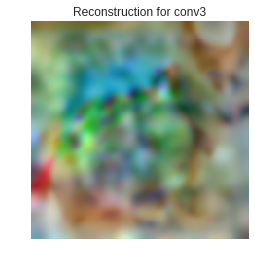

In [38]:
LAYER_NAME = "conv3"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 100.0 * np.exp(-i/100.0),
           regularization=1e-7,
           num_iter=1000,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/200) Layer name: conv4, learning_rate: 100.0, loss: 2635521.5 (2635520.0 target + 1.498835563659668 reg)
Captured activations
(2/200) Layer name: conv4, learning_rate: 99.0049833749168, loss: 1703501.625 (1703500.125 target + 1.4969450235366821 reg)
Captured activations
(3/200) Layer name: conv4, learning_rate: 98.01986733067552, loss: 897097.3125 (897095.8125 target + 1.4940645694732666 reg)
Captured activations
(4/200) Layer name: conv4, learning_rate: 97.04455335485082, loss: 475365.1875 (475363.6875 target + 1.4913294315338135 reg)
Captured activations
(5/200) Layer name: conv4, learning_rate: 96.07894391523232, loss: 271119.28125 (271117.78125 target + 1.489653468132019 reg)
Captured activations
(6/200) Layer name: conv4, learning_rate: 95.1229424500714, loss: 171966.375 (171964.890625 target + 1.4894524812698364 reg)
Captured activations
(7/200) Layer name: conv4, learning_r

(49/200) Layer name: conv4, learning_rate: 61.878339180614084, loss: 5638.02197265625 (5637.84814453125 target + 0.17378661036491394 reg)
Captured activations
(50/200) Layer name: conv4, learning_rate: 61.26263941844161, loss: 5184.19873046875 (5184.021484375 target + 0.17709539830684662 reg)
Captured activations
(51/200) Layer name: conv4, learning_rate: 60.653065971263345, loss: 5053.970703125 (5053.79052734375 target + 0.18031969666481018 reg)
Captured activations
(52/200) Layer name: conv4, learning_rate: 60.04955788122659, loss: 5153.828125 (5153.66845703125 target + 0.1594454050064087 reg)
Captured activations
(53/200) Layer name: conv4, learning_rate: 59.452054797019436, loss: 4857.541015625 (4857.37890625 target + 0.1622592955827713 reg)
Captured activations
(54/200) Layer name: conv4, learning_rate: 58.860496967835516, loss: 4618.10400390625 (4617.93896484375 target + 0.16501431167125702 reg)
Captured activations
(55/200) Layer name: conv4, learning_rate: 58.274825237398964, l

(97/200) Layer name: conv4, learning_rate: 38.28928859751121, loss: 3601.758056640625 (3601.657470703125 target + 0.1005747988820076 reg)
Captured activations
(98/200) Layer name: conv4, learning_rate: 37.90830381033988, loss: 3633.569091796875 (3633.4677734375 target + 0.10131567716598511 reg)
Captured activations
(99/200) Layer name: conv4, learning_rate: 37.531109885139955, loss: 3529.80322265625 (3529.701171875 target + 0.10207078605890274 reg)
Captured activations
(100/200) Layer name: conv4, learning_rate: 37.15766910220457, loss: 3612.373779296875 (3612.27099609375 target + 0.10282530635595322 reg)
Captured activations
(101/200) Layer name: conv4, learning_rate: 36.787944117144235, loss: 3510.746826171875 (3510.64306640625 target + 0.10363838821649551 reg)
Captured activations
(102/200) Layer name: conv4, learning_rate: 36.42189795715233, loss: 3530.46142578125 (3530.36572265625 target + 0.09580270946025848 reg)
Captured activations
(103/200) Layer name: conv4, learning_rate: 36

(145/200) Layer name: conv4, learning_rate: 23.692775868212177, loss: 2933.415771484375 (2933.347900390625 target + 0.0679897665977478 reg)
Captured activations
(146/200) Layer name: conv4, learning_rate: 23.457028809379764, loss: 2840.789306640625 (2840.72119140625 target + 0.06820614635944366 reg)
Captured activations
(147/200) Layer name: conv4, learning_rate: 23.223627472975885, loss: 2956.84716796875 (2956.78271484375 target + 0.06449943780899048 reg)
Captured activations
(148/200) Layer name: conv4, learning_rate: 22.992548518672386, loss: 3185.868408203125 (3185.8037109375 target + 0.06475261598825455 reg)
Captured activations
(149/200) Layer name: conv4, learning_rate: 22.763768838381274, loss: 3080.05810546875 (3079.9931640625 target + 0.06498417258262634 reg)
Captured activations
(150/200) Layer name: conv4, learning_rate: 22.53726555394387, loss: 2813.213623046875 (2813.1484375 target + 0.06518638879060745 reg)
Captured activations
(151/200) Layer name: conv4, learning_rate:

(193/200) Layer name: conv4, learning_rate: 14.660696213035015, loss: 2408.53466796875 (2408.48828125 target + 0.04627041891217232 reg)
Captured activations
(194/200) Layer name: conv4, learning_rate: 14.514819848362373, loss: 2221.187255859375 (2221.140869140625 target + 0.04637259989976883 reg)
Captured activations
(195/200) Layer name: conv4, learning_rate: 14.370394977770292, loss: 2254.712646484375 (2254.666259765625 target + 0.046462446451187134 reg)
Captured activations
(196/200) Layer name: conv4, learning_rate: 14.227407158651358, loss: 2208.6796875 (2208.633056640625 target + 0.04655289277434349 reg)
Captured activations
(197/200) Layer name: conv4, learning_rate: 14.0858420921045, loss: 2233.215087890625 (2233.17041015625 target + 0.044659148901700974 reg)
Captured activations
(198/200) Layer name: conv4, learning_rate: 13.945685621505094, loss: 2344.60888671875 (2344.564208984375 target + 0.04474972188472748 reg)
Captured activations
(199/200) Layer name: conv4, learning_ra

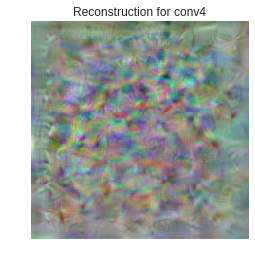

In [39]:
LAYER_NAME = "conv4"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 100.0 * np.exp(-i/100.0),
           regularization=5e-8,
           num_iter=200,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/200) Layer name: conv5, learning_rate: 1000.0, loss: 820705.875 (820705.5625 target + 0.30169227719306946 reg)
Captured activations
(2/200) Layer name: conv5, learning_rate: 990.0498337491681, loss: 347253.09375 (347252.78125 target + 0.3034217953681946 reg)
Captured activations
(3/200) Layer name: conv5, learning_rate: 980.1986733067553, loss: 153564.609375 (153564.296875 target + 0.3131033480167389 reg)
Captured activations
(4/200) Layer name: conv5, learning_rate: 970.4455335485081, loss: 119912.0546875 (119911.71875 target + 0.3345348834991455 reg)
Captured activations
(5/200) Layer name: conv5, learning_rate: 960.7894391523232, loss: 152598.390625 (152598.015625 target + 0.37149304151535034 reg)
Captured activations
(6/200) Layer name: conv5, learning_rate: 951.229424500714, loss: 95339.3359375 (95338.9140625 target + 0.42439502477645874 reg)
Captured activations
(7/200) Laye

(49/200) Layer name: conv5, learning_rate: 618.7833918061408, loss: 7936.734375 (7934.7451171875 target + 1.989294409751892 reg)
Captured activations
(50/200) Layer name: conv5, learning_rate: 612.6263941844161, loss: 8577.326171875 (8575.26171875 target + 2.0649304389953613 reg)
Captured activations
(51/200) Layer name: conv5, learning_rate: 606.5306597126335, loss: 9758.66015625 (9756.5185546875 target + 2.1416220664978027 reg)
Captured activations
(52/200) Layer name: conv5, learning_rate: 600.4955788122659, loss: 11322.650390625 (11320.787109375 target + 1.8628932237625122 reg)
Captured activations
(53/200) Layer name: conv5, learning_rate: 594.5205479701943, loss: 7130.8271484375 (7128.89990234375 target + 1.9274541139602661 reg)
Captured activations
(54/200) Layer name: conv5, learning_rate: 588.6049696783551, loss: 6402.0654296875 (6400.07177734375 target + 1.9937955141067505 reg)
Captured activations
(55/200) Layer name: conv5, learning_rate: 582.7482523739897, loss: 6955.61083

(97/200) Layer name: conv5, learning_rate: 382.89288597511205, loss: 6162.7861328125 (6161.1708984375 target + 1.6153441667556763 reg)
Captured activations
(98/200) Layer name: conv5, learning_rate: 379.08303810339885, loss: 4680.3466796875 (4678.70263671875 target + 1.6441820859909058 reg)
Captured activations
(99/200) Layer name: conv5, learning_rate: 375.31109885139955, loss: 5404.5546875 (5402.88037109375 target + 1.674189805984497 reg)
Captured activations
(100/200) Layer name: conv5, learning_rate: 371.57669102204574, loss: 4306.5458984375 (4304.84130859375 target + 1.704586386680603 reg)
Captured activations
(101/200) Layer name: conv5, learning_rate: 367.87944117144235, loss: 3918.859130859375 (3917.124267578125 target + 1.7349672317504883 reg)
Captured activations
(102/200) Layer name: conv5, learning_rate: 364.21897957152333, loss: 4594.3388671875 (4592.77734375 target + 1.5616004467010498 reg)
Captured activations
(103/200) Layer name: conv5, learning_rate: 360.5949401730783

(145/200) Layer name: conv5, learning_rate: 236.92775868212178, loss: 3189.768798828125 (3188.5947265625 target + 1.173952579498291 reg)
Captured activations
(146/200) Layer name: conv5, learning_rate: 234.57028809379764, loss: 3036.39208984375 (3035.20654296875 target + 1.1855984926223755 reg)
Captured activations
(147/200) Layer name: conv5, learning_rate: 232.23627472975883, loss: 4483.341796875 (4482.248046875 target + 1.093944787979126 reg)
Captured activations
(148/200) Layer name: conv5, learning_rate: 229.92548518672385, loss: 3523.71533203125 (3522.61181640625 target + 1.10344660282135 reg)
Captured activations
(149/200) Layer name: conv5, learning_rate: 227.63768838381273, loss: 3254.15478515625 (3253.04150390625 target + 1.113298773765564 reg)
Captured activations
(150/200) Layer name: conv5, learning_rate: 225.3726555394387, loss: 3220.200927734375 (3219.077392578125 target + 1.1234776973724365 reg)
Captured activations
(151/200) Layer name: conv5, learning_rate: 223.130160

(193/200) Layer name: conv5, learning_rate: 146.60696213035015, loss: 2801.2001953125 (2800.444091796875 target + 0.7561308145523071 reg)
Captured activations
(194/200) Layer name: conv5, learning_rate: 145.14819848362373, loss: 2920.563232421875 (2919.803466796875 target + 0.7598010301589966 reg)
Captured activations
(195/200) Layer name: conv5, learning_rate: 143.70394977770292, loss: 2771.76220703125 (2770.998779296875 target + 0.7635368704795837 reg)
Captured activations
(196/200) Layer name: conv5, learning_rate: 142.2740715865136, loss: 2872.607421875 (2871.840087890625 target + 0.7672707438468933 reg)
Captured activations
(197/200) Layer name: conv5, learning_rate: 140.858420921045, loss: 3162.2099609375 (3161.487548828125 target + 0.722467303276062 reg)
Captured activations
(198/200) Layer name: conv5, learning_rate: 139.45685621505095, loss: 2854.856201171875 (2854.130859375 target + 0.7253723740577698 reg)
Captured activations
(199/200) Layer name: conv5, learning_rate: 138.0

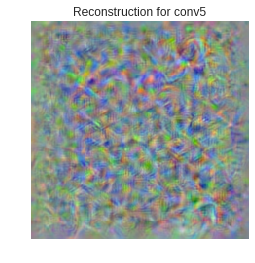

In [40]:
LAYER_NAME = "conv5"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 1000.0 * np.exp(-i/100.0),
           regularization=1e-8,
           num_iter=200,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/200) Layer name: fc6, learning_rate: 1000.0, loss: 144.15194702148438 (143.85154724121094 target + 0.300397664308548 reg)
Captured activations
(2/200) Layer name: fc6, learning_rate: 990.0498337491681, loss: 47.30037307739258 (46.99759292602539 target + 0.3027787506580353 reg)
Captured activations
(3/200) Layer name: fc6, learning_rate: 980.1986733067553, loss: 28.384305953979492 (28.06831169128418 target + 0.3159942626953125 reg)
Captured activations
(4/200) Layer name: fc6, learning_rate: 970.4455335485081, loss: 20.24361801147461 (19.899015426635742 target + 0.34460270404815674 reg)
Captured activations
(5/200) Layer name: fc6, learning_rate: 960.7894391523232, loss: 24.581127166748047 (24.190515518188477 target + 0.3906117081642151 reg)
Captured activations
(6/200) Layer name: fc6, learning_rate: 951.229424500714, loss: 46.463233947753906 (46.0089225769043 target + 0.454311877

(35/200) Layer name: fc6, learning_rate: 711.7703227626097, loss: 6.741001129150391 (4.437829494476318 target + 2.303171396255493 reg)
Captured activations
(36/200) Layer name: fc6, learning_rate: 704.6880897187134, loss: 7.952965259552002 (5.511943817138672 target + 2.44102144241333 reg)
Captured activations
(37/200) Layer name: fc6, learning_rate: 697.676326071031, loss: 7.0499982833862305 (4.99468469619751 target + 2.0553135871887207 reg)
Captured activations
(38/200) Layer name: fc6, learning_rate: 690.7343306373547, loss: 6.676830291748047 (4.503450870513916 target + 2.1733791828155518 reg)
Captured activations
(39/200) Layer name: fc6, learning_rate: 683.8614092123559, loss: 6.369592666625977 (4.074779033660889 target + 2.294813632965088 reg)
Captured activations
(40/200) Layer name: fc6, learning_rate: 677.0568744981647, loss: 7.2548394203186035 (4.836579322814941 target + 2.418260097503662 reg)
Captured activations
(41/200) Layer name: fc6, learning_rate: 670.3200460356393, los

(70/200) Layer name: fc6, learning_rate: 501.57606906605554, loss: 7.314028739929199 (5.092609405517578 target + 2.221419095993042 reg)
Captured activations
(71/200) Layer name: fc6, learning_rate: 496.5853037914095, loss: 6.427228927612305 (4.153695583343506 target + 2.273533582687378 reg)
Captured activations
(72/200) Layer name: fc6, learning_rate: 491.64419746096513, loss: 6.386087417602539 (4.4201273918151855 target + 1.9659597873687744 reg)
Captured activations
(73/200) Layer name: fc6, learning_rate: 486.7522559599717, loss: 6.1392717361450195 (4.127418518066406 target + 2.0118534564971924 reg)
Captured activations
(74/200) Layer name: fc6, learning_rate: 481.90899009020245, loss: 6.259968280792236 (4.200552940368652 target + 2.059415340423584 reg)
Captured activations
(75/200) Layer name: fc6, learning_rate: 477.11391552103436, loss: 6.168501853942871 (4.0600972175598145 target + 2.1084043979644775 reg)
Captured activations
(76/200) Layer name: fc6, learning_rate: 472.366552741

(105/200) Layer name: fc6, learning_rate: 353.45468195878016, loss: 5.697711944580078 (4.3239665031433105 target + 1.3737454414367676 reg)
Captured activations
(106/200) Layer name: fc6, learning_rate: 349.9377491111553, loss: 5.4907402992248535 (4.09481143951416 target + 1.395928978919983 reg)
Captured activations
(107/200) Layer name: fc6, learning_rate: 346.4558103300574, loss: 16.77667999267578 (15.549476623535156 target + 1.2272028923034668 reg)
Captured activations
(108/200) Layer name: fc6, learning_rate: 343.0085174187066, loss: 9.932891845703125 (8.689231872558594 target + 1.2436600923538208 reg)
Captured activations
(109/200) Layer name: fc6, learning_rate: 339.59552564493913, loss: 6.409695625305176 (5.148342609405518 target + 1.2613528966903687 reg)
Captured activations
(110/200) Layer name: fc6, learning_rate: 336.21649370673333, loss: 5.4597697257995605 (4.179651737213135 target + 1.2801179885864258 reg)
Captured activations
(111/200) Layer name: fc6, learning_rate: 332.8

(140/200) Layer name: fc6, learning_rate: 249.07530463166822, loss: 4.987081050872803 (4.141340732574463 target + 0.8457403779029846 reg)
Captured activations
(141/200) Layer name: fc6, learning_rate: 246.5969639416065, loss: 4.936326026916504 (4.082298278808594 target + 0.8540275692939758 reg)
Captured activations
(142/200) Layer name: fc6, learning_rate: 244.14328315343712, loss: 5.421721458435059 (4.659741401672363 target + 0.7619799375534058 reg)
Captured activations
(143/200) Layer name: fc6, learning_rate: 241.71401689703646, loss: 4.788799285888672 (4.020300388336182 target + 0.7684986591339111 reg)
Captured activations
(144/200) Layer name: fc6, learning_rate: 239.30892224375455, loss: 4.938652515411377 (4.163815975189209 target + 0.774836540222168 reg)
Captured activations
(145/200) Layer name: fc6, learning_rate: 236.92775868212178, loss: 4.803403377532959 (4.021712779998779 target + 0.7816904187202454 reg)
Captured activations
(146/200) Layer name: fc6, learning_rate: 234.57

(174/200) Layer name: fc6, learning_rate: 177.28440996987783, loss: 4.621829986572266 (4.084531784057617 target + 0.5372981429100037 reg)
Captured activations
(175/200) Layer name: fc6, learning_rate: 175.52040061699685, loss: 4.641450881958008 (4.098915100097656 target + 0.5425359010696411 reg)
Captured activations
(176/200) Layer name: fc6, learning_rate: 173.77394345044513, loss: 4.838046073913574 (4.290539264678955 target + 0.5475069284439087 reg)
Captured activations
(177/200) Layer name: fc6, learning_rate: 172.04486382305055, loss: 4.679505348205566 (4.181029319763184 target + 0.4984760880470276 reg)
Captured activations
(178/200) Layer name: fc6, learning_rate: 170.33298882540942, loss: 4.948330879211426 (4.445850849151611 target + 0.5024798512458801 reg)
Captured activations
(179/200) Layer name: fc6, learning_rate: 168.6381472685955, loss: 4.656528472900391 (4.149612903594971 target + 0.5069157481193542 reg)
Captured activations
(180/200) Layer name: fc6, learning_rate: 166.9

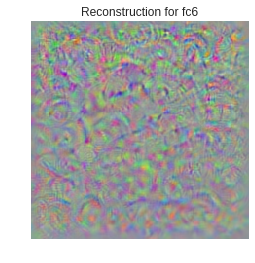

In [41]:
LAYER_NAME = "fc6"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 1000.0 * np.exp(-i/100.0),
           regularization=1e-8,
           num_iter=200,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

Loading pre-trained weights from model zoo
Captured activations
Inverting features
Captured activations
(1/200) Layer name: fc8, learning_rate: 1000.0, loss: 217.1990509033203 (217.19602966308594 target + 0.0030267322435975075 reg)
Captured activations
(2/200) Layer name: fc8, learning_rate: 990.0498337491681, loss: 108.45429992675781 (108.45124816894531 target + 0.003050395054742694 reg)
Captured activations
(3/200) Layer name: fc8, learning_rate: 980.1986733067553, loss: 69.13054656982422 (69.12736511230469 target + 0.0031795664690434933 reg)
Captured activations
(4/200) Layer name: fc8, learning_rate: 970.4455335485081, loss: 81.66338348388672 (81.65991973876953 target + 0.0034604195971041918 reg)
Captured activations
(5/200) Layer name: fc8, learning_rate: 960.7894391523232, loss: 55.408241271972656 (55.404327392578125 target + 0.003915582317858934 reg)
Captured activations
(6/200) Layer name: fc8, learning_rate: 951.229424500714, loss: 29.551977157592773 (29.547420501708984 target

(35/200) Layer name: fc8, learning_rate: 711.7703227626097, loss: 6.529302597045898 (6.503634929656982 target + 0.025667820125818253 reg)
Captured activations
(36/200) Layer name: fc8, learning_rate: 704.6880897187134, loss: 7.384672164916992 (7.35748815536499 target + 0.027183772996068 reg)
Captured activations
(37/200) Layer name: fc8, learning_rate: 697.676326071031, loss: 7.287920951843262 (7.264919757843018 target + 0.02300102822482586 reg)
Captured activations
(38/200) Layer name: fc8, learning_rate: 690.7343306373547, loss: 6.00333833694458 (5.979034423828125 target + 0.024303799495100975 reg)
Captured activations
(39/200) Layer name: fc8, learning_rate: 683.8614092123559, loss: 5.1237640380859375 (5.098121643066406 target + 0.02564222924411297 reg)
Captured activations
(40/200) Layer name: fc8, learning_rate: 677.0568744981647, loss: 29.22716522216797 (29.20014190673828 target + 0.027023306116461754 reg)
Captured activations
(41/200) Layer name: fc8, learning_rate: 670.32004603

(70/200) Layer name: fc8, learning_rate: 501.57606906605554, loss: 4.3601226806640625 (4.332387447357178 target + 0.02773534134030342 reg)
Captured activations
(71/200) Layer name: fc8, learning_rate: 496.5853037914095, loss: 7.2257208824157715 (7.19726037979126 target + 0.028460605069994926 reg)
Captured activations
(72/200) Layer name: fc8, learning_rate: 491.64419746096513, loss: 4.9667816162109375 (4.941659450531006 target + 0.02512224204838276 reg)
Captured activations
(73/200) Layer name: fc8, learning_rate: 486.7522559599717, loss: 4.679641246795654 (4.653922080993652 target + 0.025719337165355682 reg)
Captured activations
(74/200) Layer name: fc8, learning_rate: 481.90899009020245, loss: 13.76102352142334 (13.734675407409668 target + 0.0263480506837368 reg)
Captured activations
(75/200) Layer name: fc8, learning_rate: 477.11391552103436, loss: 5.882694244384766 (5.8557209968566895 target + 0.02697320282459259 reg)
Captured activations
(76/200) Layer name: fc8, learning_rate: 47

(104/200) Layer name: fc8, learning_rate: 357.0069605691474, loss: 4.337630748748779 (4.316377639770508 target + 0.02125299908220768 reg)
Captured activations
(105/200) Layer name: fc8, learning_rate: 353.45468195878016, loss: 2.772271156311035 (2.750710964202881 target + 0.02156016230583191 reg)
Captured activations
(106/200) Layer name: fc8, learning_rate: 349.9377491111553, loss: 2.33457088470459 (2.312696933746338 target + 0.021873904392123222 reg)
Captured activations
(107/200) Layer name: fc8, learning_rate: 346.4558103300574, loss: 3.086127519607544 (3.0662741661071777 target + 0.01985323801636696 reg)
Captured activations
(108/200) Layer name: fc8, learning_rate: 343.0085174187066, loss: 3.339242935180664 (3.3191046714782715 target + 0.020138276740908623 reg)
Captured activations
(109/200) Layer name: fc8, learning_rate: 339.59552564493913, loss: 2.713871955871582 (2.6934447288513184 target + 0.020427269861102104 reg)
Captured activations
(110/200) Layer name: fc8, learning_rat

(138/200) Layer name: fc8, learning_rate: 254.10695955280028, loss: 3.1368086338043213 (3.1209490299224854 target + 0.01585967466235161 reg)
Captured activations
(139/200) Layer name: fc8, learning_rate: 251.57855305975653, loss: 2.2982070446014404 (2.2822020053863525 target + 0.01600511372089386 reg)
Captured activations
(140/200) Layer name: fc8, learning_rate: 249.07530463166822, loss: 2.3247077465057373 (2.3085522651672363 target + 0.016155565157532692 reg)
Captured activations
(141/200) Layer name: fc8, learning_rate: 246.5969639416065, loss: 2.300445079803467 (2.284135341644287 target + 0.01630963385105133 reg)
Captured activations
(142/200) Layer name: fc8, learning_rate: 244.14328315343712, loss: 2.381896495819092 (2.366831064224243 target + 0.015065411105751991 reg)
Captured activations
(143/200) Layer name: fc8, learning_rate: 241.71401689703646, loss: 2.2636971473693848 (2.2485008239746094 target + 0.015196356922388077 reg)
Captured activations
(144/200) Layer name: fc8, lea

(172/200) Layer name: fc8, learning_rate: 180.8657926171221, loss: 2.188397169113159 (2.176804304122925 target + 0.011592784896492958 reg)
Captured activations
(173/200) Layer name: fc8, learning_rate: 179.06614791149323, loss: 1.9009736776351929 (1.8893277645111084 target + 0.011645934544503689 reg)
Captured activations
(174/200) Layer name: fc8, learning_rate: 177.28440996987783, loss: 2.328714609146118 (2.3170104026794434 target + 0.011704321019351482 reg)
Captured activations
(175/200) Layer name: fc8, learning_rate: 175.52040061699685, loss: 1.9752812385559082 (1.9635225534439087 target + 0.011758636683225632 reg)
Captured activations
(176/200) Layer name: fc8, learning_rate: 173.77394345044513, loss: 1.8797086477279663 (1.8678990602493286 target + 0.011809559538960457 reg)
Captured activations
(177/200) Layer name: fc8, learning_rate: 172.04486382305055, loss: 2.029862880706787 (2.0187742710113525 target + 0.011088511906564236 reg)
Captured activations
(178/200) Layer name: fc8, 

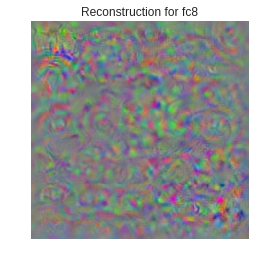

In [42]:
LAYER_NAME = "fc8"

rec_image = make_feature_inversion(image,
           layer_name=LAYER_NAME,
           variable_learning_rate=lambda i: 1000.0 * np.exp(-i/100.0),
           regularization=1e-10,
           num_iter=200,
           blur_every=5,
           momentum=0.9)

show_image(rec_image, f"Reconstruction for {LAYER_NAME}")

## Question

(a) What happens to the quality of the reconstruction as you reconstruct from higher layers? Why does this happen? What does this suggest about the representation at each layer?

(b) Why did we adjust the regularization parameter to a different value for some layers? How might the objective function be changed so that a different value isn't needed for each layer?

### **<font color="red">TODO 7b: Answer in solution cell as a comment.</font>**

# Test cases
## Run These blocks to test your code

### Helper functions

In [0]:
import io
base_dir = "http://www.cs.cornell.edu/courses/cs5670/2018sp/projects/"
def _load(fname):
    """ Helper to load compressed .npz arrays """
    f = urllib.request.urlopen(base_dir+fname).read()
    f = io.BytesIO(f)
    return np.load(f)['arr_0']


def relative_error(expected, actual, epsilon=1e-5):
    """ Mean relative error between two arrays """
    return np.mean(
        np.abs(expected - actual) /
        np.maximum(np.abs(actual), epsilon)
    )

### Test `compute_dscore_dimage`

In [41]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_compute_dscore_dimage():
    image = _load("expected/data.npz")
    expected =  _load("expected/compute_dscore_dimage-grad.npz")
    image = torch.from_numpy(image).unsqueeze(0)    
    image_in = Variable(image, requires_grad=True)
    cls_scores = net(image_in)[0]
    actual_grad = compute_dscore_dimage(cls_scores, image_in, 254)

    # relative error must be small
    assert relative_error(expected, actual_grad.data.numpy()) < THRESH
    print("Passed!")
test_compute_dscore_dimage()

Loading pre-trained weights from model zoo
Passed!


### Test `normalized_sgd_with_momentum_update`

In [42]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_normalized_sgd_with_momentum_update():
    image = _load("expected/data.npz")
    grad = _load('expected/normalized_sgd_with_momentum_update-grad.npz')
    velocity = _load('expected/normalized_sgd_with_momentum_update-velocity.npz')
    expected_data = _load('expected/normalized_sgd_with_momentum_update-new_data.npz')
    expected_velocity = _load('expected/normalized_sgd_with_momentum_update-new_velocity.npz')
    
    image = torch.from_numpy(image).unsqueeze(0)
    image = Variable(image, requires_grad=True)

    grad = torch.from_numpy(grad).unsqueeze(0)
    grad = Variable(grad, requires_grad=True)

    velocity = torch.from_numpy(velocity).unsqueeze(0)
    velocity = Variable(velocity, requires_grad=True)

    momentum = 0.99
    learning_rate = 100
    new_data, new_velocity = normalized_sgd_with_momentum_update(
        image, grad, velocity, momentum, learning_rate)
    
    # relative error must be small
    assert relative_error(expected_data, new_data.data.numpy()) < THRESH
    assert relative_error(expected_velocity, new_velocity.data.numpy()) < THRESH
    print("Passed!")
test_normalized_sgd_with_momentum_update()

Loading pre-trained weights from model zoo
Passed!


### Test `fooling_image_gradient`

In [43]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_fooling_image_gradient():
    image = torch.from_numpy(_load("expected/data.npz")).unsqueeze(0)
    image = Variable(image, requires_grad=True)

    new_image = torch.from_numpy(\
            _load("expected/normalized_sgd_with_momentum_update-new_data.npz"))
    new_image = Variable(new_image, requires_grad=True)
    
    curr_scores = net(new_image)[0]
    target_score = curr_scores[113]
    regularization = 1e-3
    
    target_grad = fooling_image_gradient(target_score, image, new_image, target_class, regularization)
    expected = _load('expected/fooling_image_gradient-grad.npz')
    assert relative_error(expected, target_grad.data.numpy()) < THRESH
    print("Passed!")
    
test_fooling_image_gradient()

Loading pre-trained weights from model zoo
Passed!


### Test `test_class_visualization_gradient`

In [44]:
net = alexnet(pretrained=True)
THRESH = 1e-2
def test_class_visualization_gradient():
    image = torch.from_numpy(_load("expected/feature_inversion_gradient-cur_data.npz")).unsqueeze(0)
    image = Variable(image, requires_grad=True)
    
    target_class = 130
    class_scores = net(image)[0]
    target_score = class_scores[target_class]
    regularization = 1e-3

    grad = class_visualization_gradient(target_score, image, target_class, regularization)
    
    expected = _load('expected/feature_inversion_gradient-grad.npz')
    assert relative_error(expected, grad.data.numpy()) < THRESH
    print("Passed!")
test_class_visualization_gradient()


Loading pre-trained weights from model zoo
Passed!
